# Glass Identification Project

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv("https://raw.githubusercontent.com/FlipRoboTechnologies/ML-Datasets/main/Glass%20Identification/Glass%20Identification.csv", header=None)

In [3]:
df.columns = ['S.No', 'RI', 'Na', 'Mg', 'Al', 'Si', 'K', 'Ca', 'Ba', 'Fe', 'Type']

In [4]:
df.sample(5)

,S.No,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
21,22,1.51966,14.77,3.75,0.29,72.02,0.03,9.00,0.00,0.00,1
139,140,1.51674,12.87,3.56,1.64,73.14,0.65,7.99,0.00,0.00,2
156,157,1.51655,13.41,3.39,1.28,72.64,0.52,8.65,0.00,0.00,3
9,10,1.51755,13.00,3.60,1.36,72.99,0.57,8.40,0.00,0.11,1
106,107,1.53125,10.73,0.00,2.10,69.81,0.58,13.30,3.15,0.28,2


Exploratory Data Analysis (EDA)

In [5]:
df.shape

(214, 11)

The dataset contains 214 rows and 11 columns, out of which "Type of Glass" is the target variable.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214 entries, 0 to 213
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   S.No    214 non-null    int64  
 1   RI      214 non-null    float64
 2   Na      214 non-null    float64
 3   Mg      214 non-null    float64
 4   Al      214 non-null    float64
 5   Si      214 non-null    float64
 6   K       214 non-null    float64
 7   Ca      214 non-null    float64
 8   Ba      214 non-null    float64
 9   Fe      214 non-null    float64
 10  Type    214 non-null    int64  
dtypes: float64(9), int64(2)
memory usage: 18.5 KB


In [7]:
df.isnull().sum()

S.No    0
RI      0
Na      0
Mg      0
Al      0
Si      0
K       0
Ca      0
Ba      0
Fe      0
Type    0
dtype: int64

There are no null values in this dataset.

<Axes: >

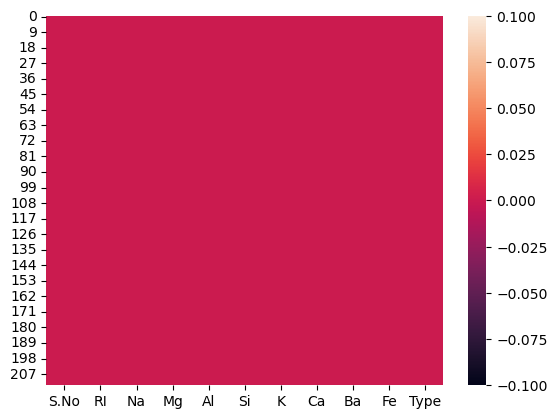

In [8]:
sns.heatmap(df.isnull())

In [9]:
df.drop(['S.No'],axis=1,inplace=True)

In [10]:
df.head()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.0,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.0,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.0,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.0,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.0,0.0,1


Now, we have removed the column 'S.No' from the dataset.

In [11]:
df['Type'].unique()

array([1, 2, 3, 5, 6, 7], dtype=int64)

There are a total of 6 unique values present in our dependent variable, 'Type'.

In [12]:
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

1.52152    3
1.51590    3
1.51645    3
1.51754    2
1.51841    2
          ..
1.51625    1
1.51569    1
1.51605    1
1.51588    1
1.51651    1
Name: RI, Length: 178, dtype: int64


13.02    5
13.21    5
13.00    5
13.64    4
13.33    4
        ..
13.34    1
13.31    1
14.17    1
13.51    1
14.23    1
Name: Na, Length: 142, dtype: int64


0.00    42
3.48     8
3.58     8
3.54     8
3.52     7
        ..
2.76     1
3.15     1
2.90     1
3.83     1
1.78     1
Name: Mg, Length: 94, dtype: int64


1.54    8
1.19    6
1.43    5
1.29    5
1.23    5
       ..
1.08    1
1.64    1
1.61    1
1.07    1
1.94    1
Name: Al, Length: 118, dtype: int64


72.86    4
72.99    4
73.10    4
73.28    4
73.11    4
        ..
73.55    1
72.34    1
72.26    1
73.26    1
73.61    1
Name: Si, Length: 133, dtype: int64


0.00    30
0.57    12
0.56    11
0.60    11
0.58    10
        ..
0.44     1
0.07     1
0.73     1
0.70     1
1.41     1
Name: K, Length: 65, dtype: int64


8.03    5
8.43    5
9.57    4
8.79    

# Data Visualization

Univariate Analysis

In [13]:
sns.set()

2    76
1    70
7    29
3    17
5    13
6     9
Name: Type, dtype: int64


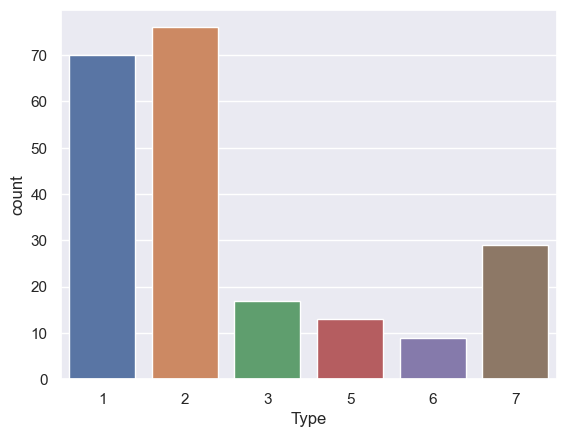

In [14]:
sns.countplot(x='Type', data=df)
print(df['Type'].value_counts())

We can observe that the majority of the glass (1, 2) belongs to window glass. There are no samples of Type 4 glass and 51 samples of non-window glass (classes 5-7).

In [15]:
df['Type']=df['Type'].apply(lambda x: 0 if x>=1 and x<=4 else 1)

In [16]:
df['Type'].unique()

array([0, 1], dtype=int64)

Now there are only two values: 0 and 1. 0 means window glass, and 1 means non-window glass, respectively.

0    163
1     51
Name: Type, dtype: int64


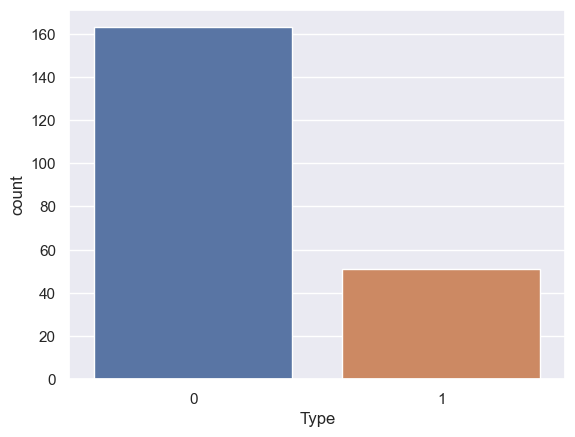

In [17]:
sns.countplot(x=df['Type'])
print(df['Type'].value_counts())

In [18]:
df.describe()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
count,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000
mean,1.518365,13.407850,2.684533,1.444907,72.650935,0.497056,8.956963,0.175047,0.057009,0.238318
std,0.003037,0.816604,1.442408,0.499270,0.774546,0.652192,1.423153,0.497219,0.097439,0.427053
min,1.511150,10.730000,0.000000,0.290000,69.810000,0.000000,5.430000,0.000000,0.000000,0.000000
25%,1.516522,12.907500,2.115000,1.190000,72.280000,0.122500,8.240000,0.000000,0.000000,0.000000
50%,1.517680,13.300000,3.480000,1.360000,72.790000,0.555000,8.600000,0.000000,0.000000,0.000000
75%,1.519157,13.825000,3.600000,1.630000,73.087500,0.610000,9.172500,0.000000,0.100000,0.000000
max,1.533930,17.380000,4.490000,3.500000,75.410000,6.210000,16.190000,3.150000,0.510000,1.000000


In [19]:
independent_column=[]
for i in df.dtypes.index:
    if df[i].dtypes==float:
        independent_column.append(i)
        
print("independent_column:", independent_column)

independent_column: ['RI', 'Na', 'Mg', 'Al', 'Si', 'K', 'Ca', 'Ba', 'Fe']


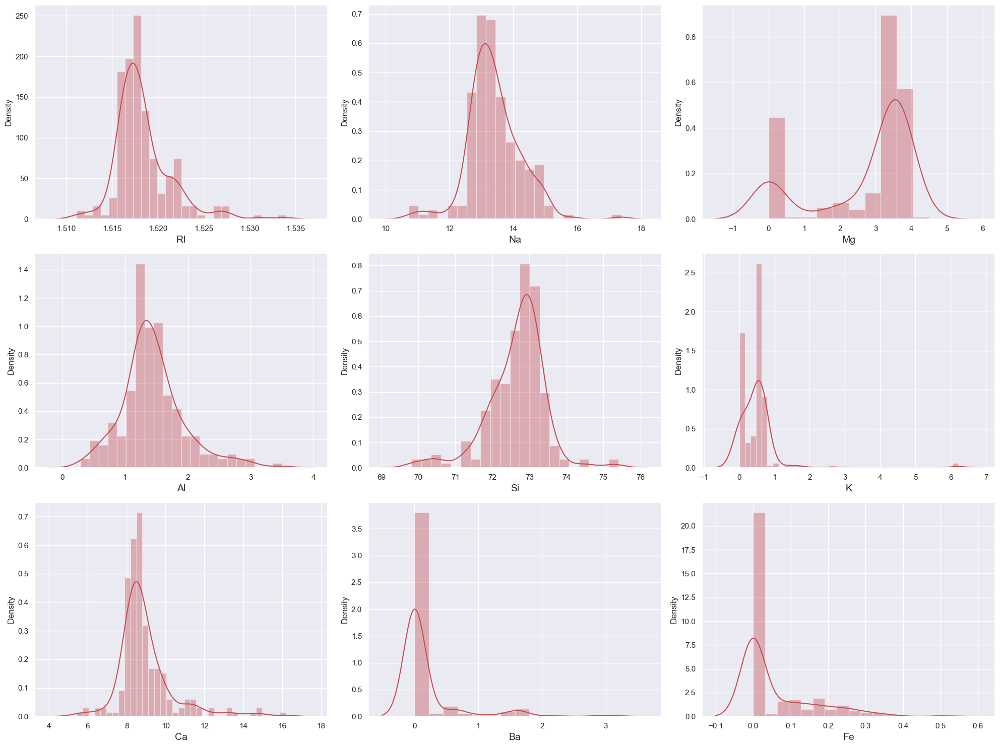

In [20]:
plt.figure(figsize=(20,15), facecolor='white')
plotnumber=1
for i in independent_column:
    if plotnumber<=9:
        plt.subplot(3,3,plotnumber)
        sns.distplot(df[i],color='r')
        plt.xlabel(i,fontsize=14)
        plotnumber+=1
plt.tight_layout()

From the above distribution plot, we can see that skewness is present in some of the features.

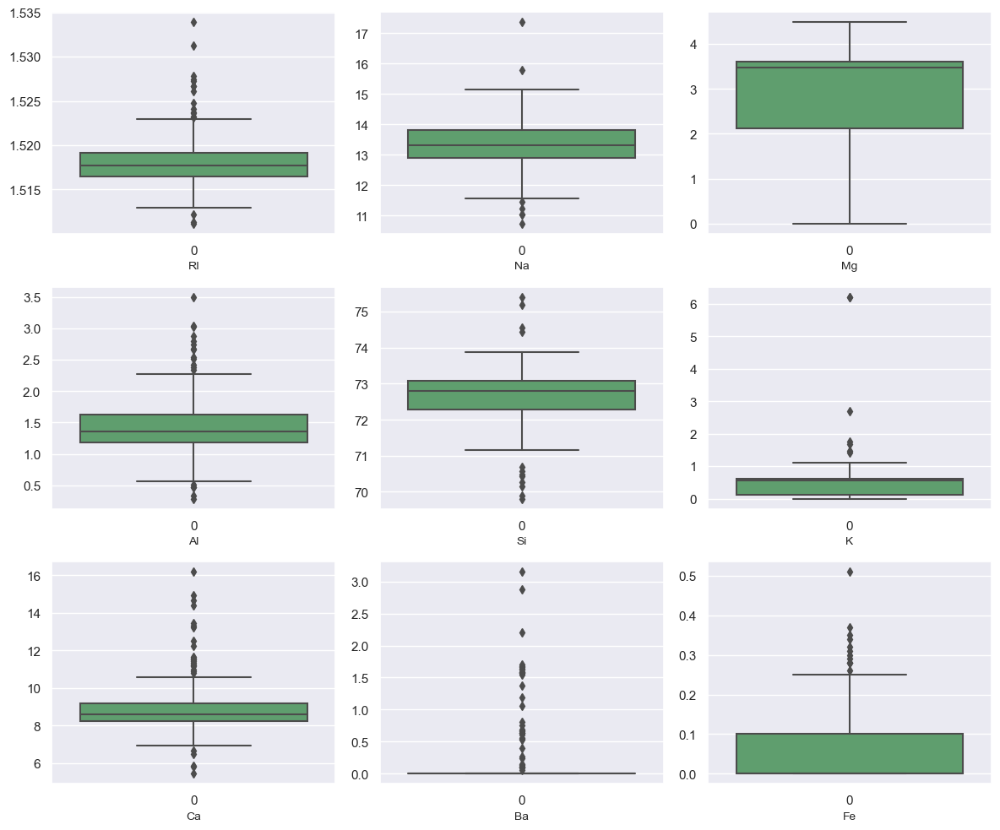

In [21]:
plt.figure(figsize=(12,10), facecolor='white')
plotnumber=1
for i in independent_column:
    if plotnumber<=9:
        plt.subplot(3,3,plotnumber)
        sns.boxplot(df[i], color='g')
        plt.xlabel(i,fontsize=10)
        plotnumber+=1
        
plt.tight_layout()

From the above graph, we can conclude that the maximum outliers are present in the Ba column.

Bivariate Analysis

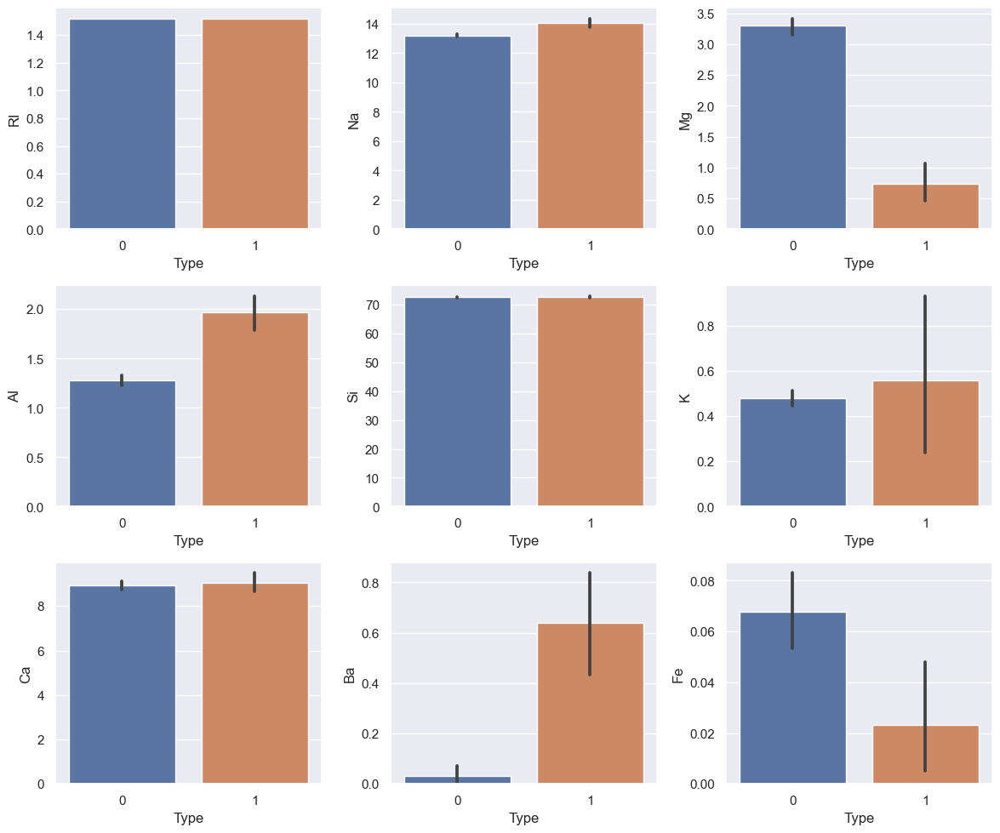

In [22]:
plt.figure(figsize=(12,10), facecolor='white')
plotnumber=1
for i in independent_column:
    if plotnumber<=9:
        plt.subplot(3,3,plotnumber)
        sns.barplot(x='Type',y=i,data=df)
        plt.xlabel('Type', fontsize=12)
        plt.ylabel(i, fontsize=12)
        plotnumber+=1
        
plt.tight_layout()

Multivariate Analysis

In [23]:
df.corr()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
RI,1.000000,-0.191885,-0.122274,-0.407326,-0.542052,-0.289833,0.810403,-0.000386,0.143010,-0.134327
Na,-0.191885,1.000000,-0.273732,0.156794,-0.069809,-0.266087,-0.275442,0.326603,-0.241346,0.452336
Mg,-0.122274,-0.273732,1.000000,-0.481799,-0.165927,0.005396,-0.443750,-0.492262,0.083060,-0.758289
Al,-0.407326,0.156794,-0.481799,1.000000,-0.005524,0.325958,-0.259592,0.479404,-0.074402,0.585928
Si,-0.542052,-0.069809,-0.165927,-0.005524,1.000000,-0.193331,-0.208732,-0.102151,-0.094201,0.148072
K,-0.289833,-0.266087,0.005396,0.325958,-0.193331,1.000000,-0.317836,-0.042618,-0.007719,0.053774
Ca,0.810403,-0.275442,-0.443750,-0.259592,-0.208732,-0.317836,1.000000,-0.112841,0.124968,0.040670
Ba,-0.000386,0.326603,-0.492262,0.479404,-0.102151,-0.042618,-0.112841,1.000000,-0.058692,0.523403
Fe,0.143010,-0.241346,0.083060,-0.074402,-0.094201,-0.007719,0.124968,-0.058692,1.000000,-0.194903
Type,-0.134327,0.452336,-0.758289,0.585928,0.148072,0.053774,0.040670,0.523403,-0.194903,1.000000


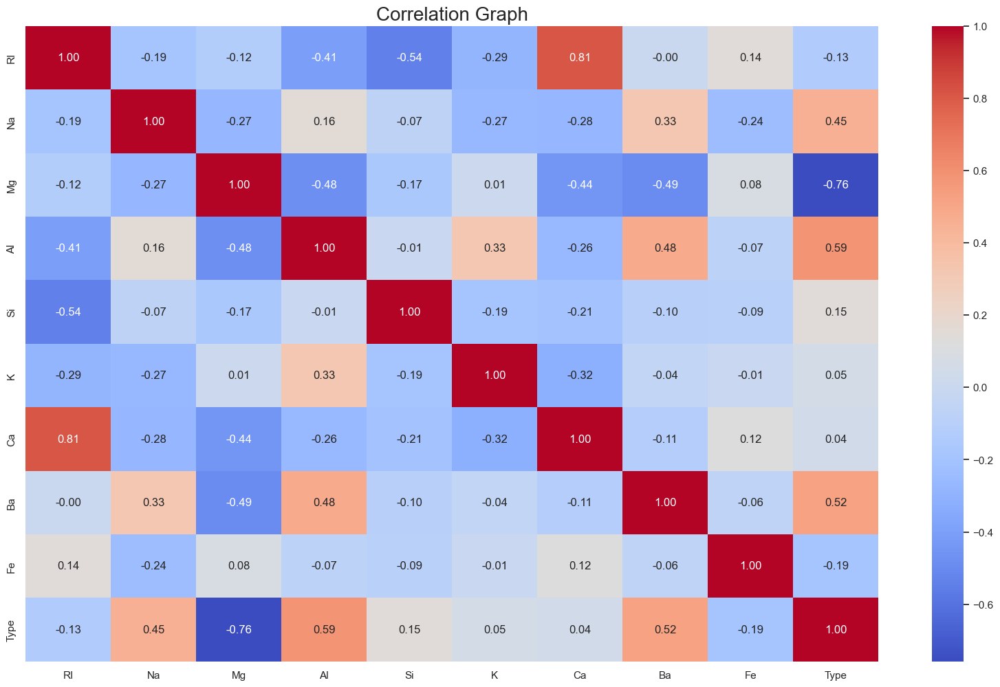

In [24]:
plt.figure(figsize=(20,12))
sns.heatmap(df.corr(), annot=True, fmt='0.2f',linecolor='black', cmap='coolwarm')
plt.title("Correlation Graph", fontsize=20)
plt.show()

In [25]:
df.corr()['Type'].sort_values()

Mg     -0.758289
Fe     -0.194903
RI     -0.134327
Ca      0.040670
K       0.053774
Si      0.148072
Na      0.452336
Ba      0.523403
Al      0.585928
Type    1.000000
Name: Type, dtype: float64

Text(0.5, 1.0, 'Correlation of Type of glass with Features')

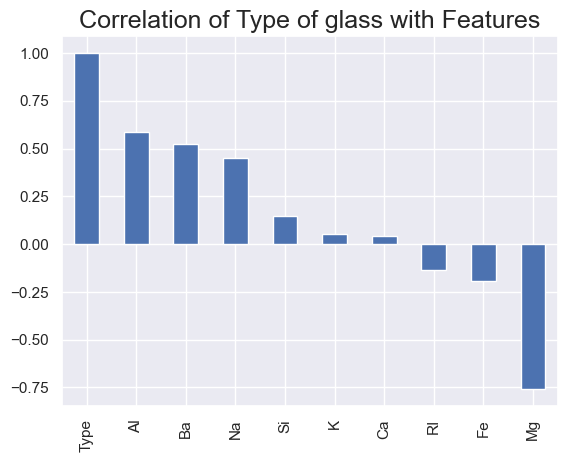

In [26]:
df.corr()['Type'].sort_values(ascending=False).plot(kind='bar',color='b')
plt.title('Correlation of Type of glass with Features',fontsize=18)

1. RI and Ca are highly positively correlated with each other.

2. The type of glass has a linear relationship with Al and Ba.

3. Types of glass and magnesium are inversely proportional to each other, as the value of one feature decreases when the value of the other feature increases, and vice versa.

<Axes: title={'center': 'Comparison Mg and Type of glass'}, xlabel='Type', ylabel='Mg'>

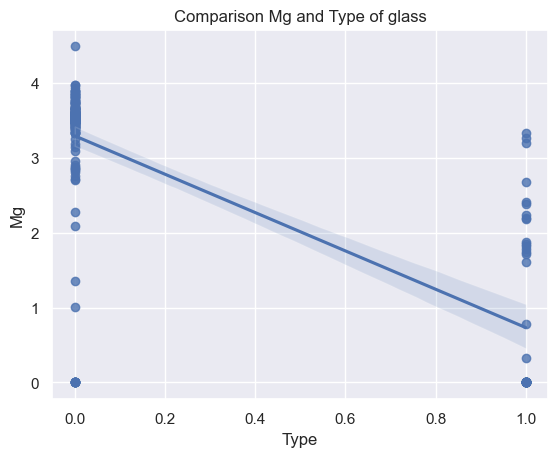

In [27]:
plt.title("Comparison Mg and Type of glass")
sns.regplot(data = df, x = 'Type', y = 'Mg')

<Axes: title={'center': 'Comparison Al and Type of glass'}, xlabel='Type', ylabel='Al'>

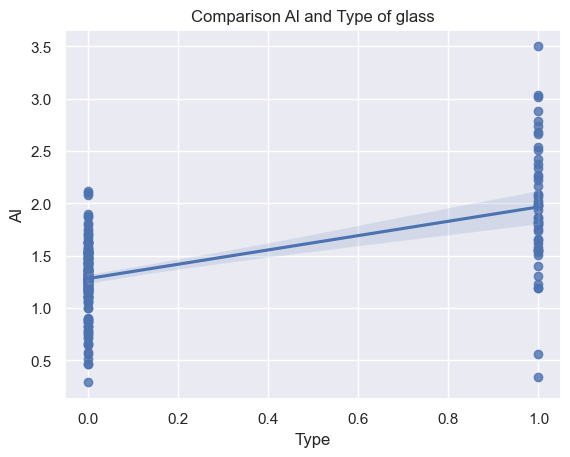

In [28]:
plt.title("Comparison Al and Type of glass")
sns.regplot(data = df, x = 'Type', y = 'Al')

<Axes: title={'center': 'Comparison Ba and Type of glass'}, xlabel='Type', ylabel='Ba'>

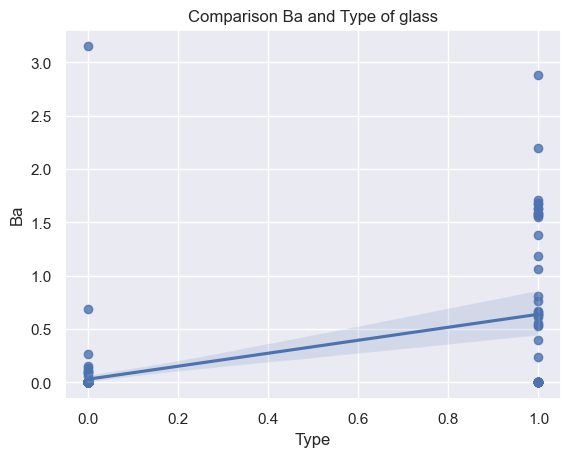

In [29]:
plt.title("Comparison Ba and Type of glass")
sns.regplot(data = df, x = 'Type', y = 'Ba')

<Axes: title={'center': 'Comparison of Ca and Refractive Index'}, xlabel='Ca', ylabel='RI'>

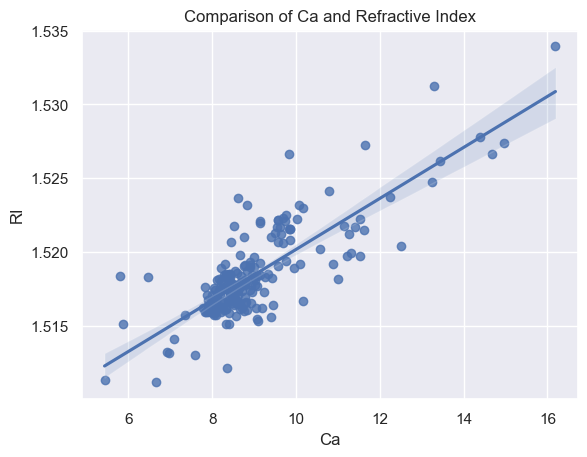

In [30]:
plt.title("Comparison of Ca and Refractive Index")
sns.regplot(data = df, x = 'Ca', y = 'RI')

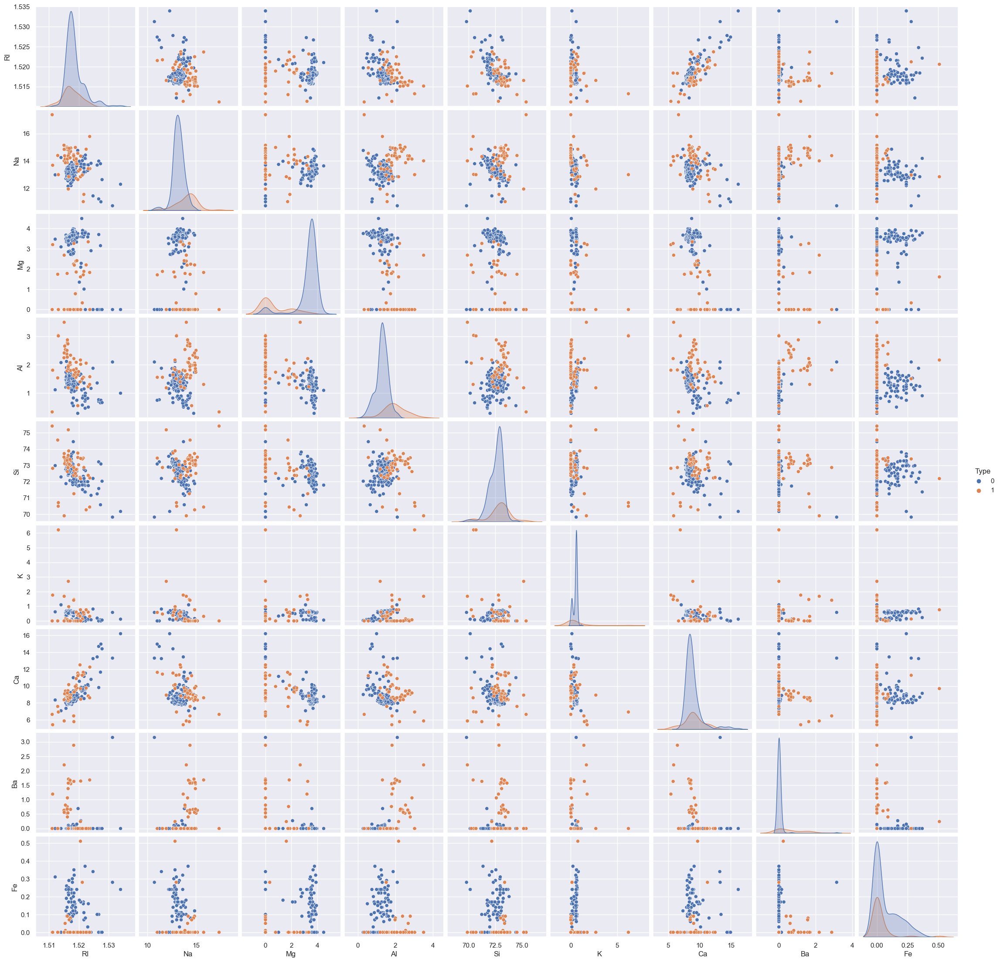

In [31]:
sns.pairplot(data=df,hue='Type')

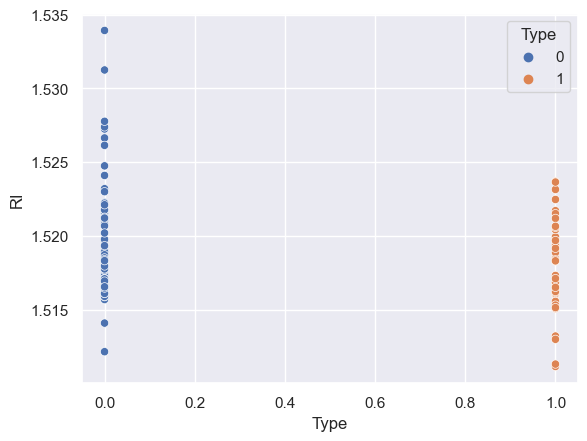

<Figure size 800x500 with 0 Axes>

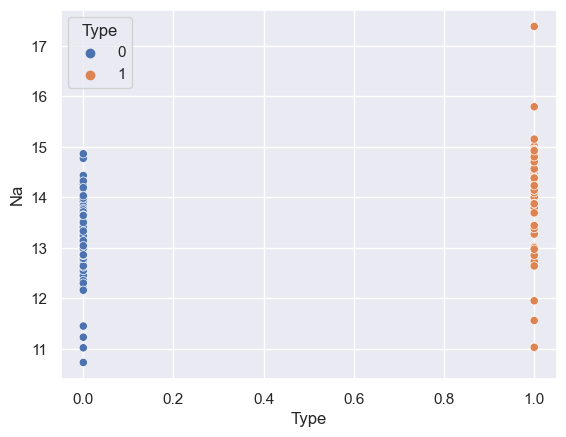

<Figure size 800x500 with 0 Axes>

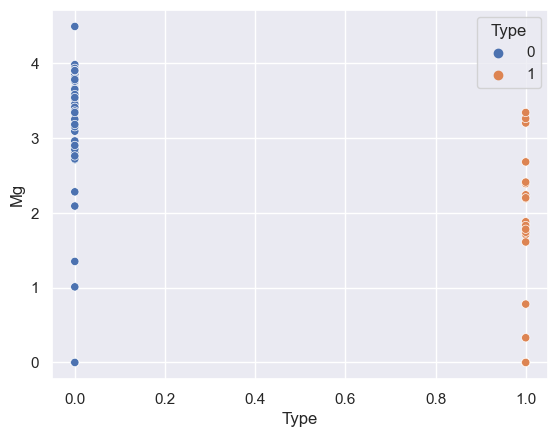

<Figure size 800x500 with 0 Axes>

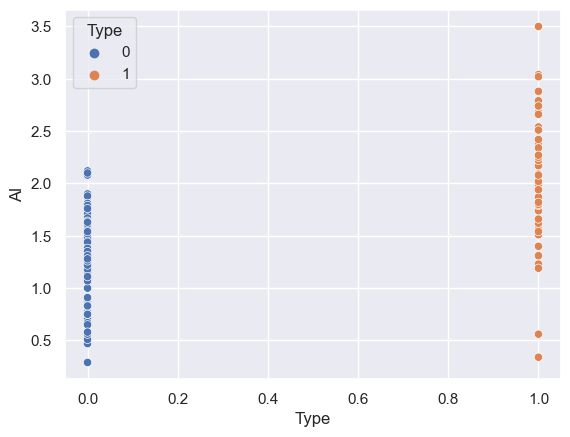

<Figure size 800x500 with 0 Axes>

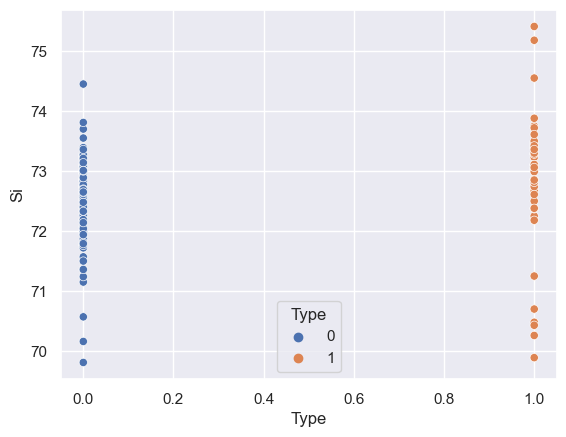

<Figure size 800x500 with 0 Axes>

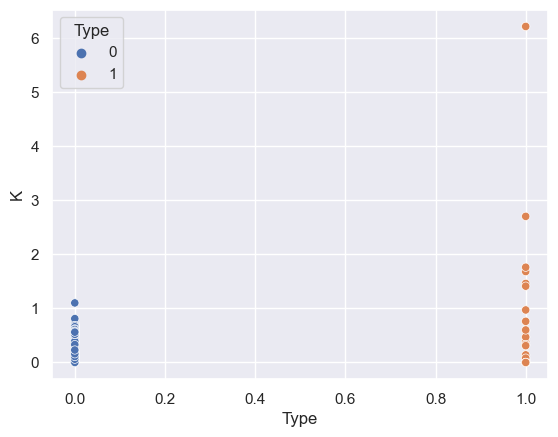

<Figure size 800x500 with 0 Axes>

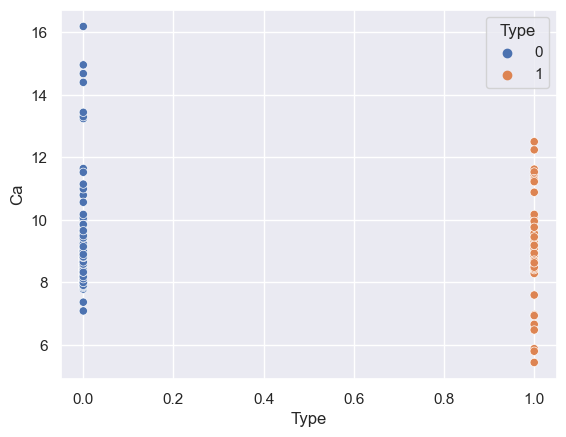

<Figure size 800x500 with 0 Axes>

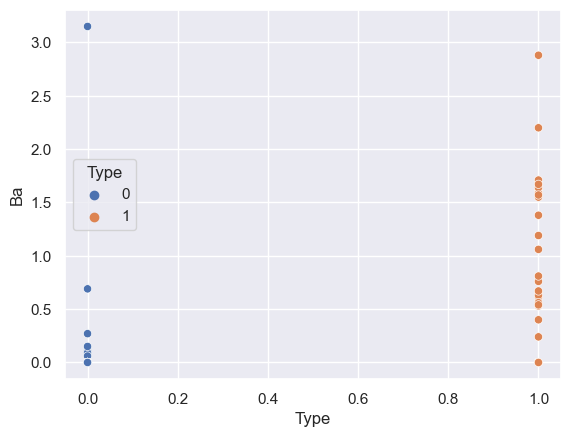

<Figure size 800x500 with 0 Axes>

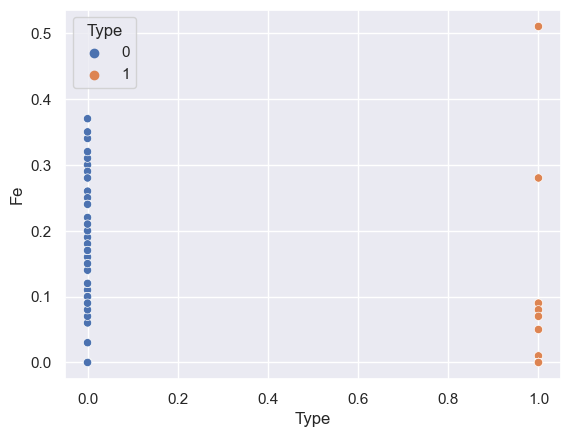

<Figure size 800x500 with 0 Axes>

In [32]:
for i in independent_column:
    sns.scatterplot(x=df['Type'],y=df[i],hue=df['Type'])
    plt.figure(figsize=(8,5))
    plt.show()

In [33]:
df['Ba'].skew()

3.4164245693025577

Since Ba has the maximum outliers as per the boxplot and the skewness is also very high, we are removing this column.

In [34]:
df.drop(['Ba'],axis=1,inplace=True)

Seperating Features & Label

In [35]:
x=df.drop(['Type'],axis=1)
y=df['Type']

In [36]:
x.head()

,RI,Na,Mg,Al,Si,K,Ca,Fe
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.0
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.0
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.0
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.0
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.0


In [37]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Type, dtype: int64

In [38]:
from scipy.stats import zscore
z=np.abs(zscore(x))
threshold=3

x=x[(z<threshold).all(axis=1)]
print(x.shape)

y=y[(z<3).all(axis=1)]
print(y.shape)

(198, 8)
(198,)


In [39]:
loss_data = (214-198)/214*100
loss_data

7.476635514018691

In [40]:
x.skew()

RI    0.964230
Na    0.464034
Mg   -1.424633
Al    0.620498
Si   -0.622500
K     0.430888
Ca    1.021982
Fe    1.517610
dtype: float64

In [41]:
from scipy.stats import boxcox,yeojohnson
from scipy.stats import skew

In [42]:
#This method is for negative and positive both values

def skewness(a):
    model=[np.sqrt(a),np.log(a),yeojohnson(a)[0]]
    print('original skewness is:',a.skew())
    print('\n')
    for m in model:
        x=m
        print(skew(m))
        print('\n')

In [43]:
#This method is for positive values only

def skewness1(i):
    model=[np.sqrt(i),np.log(i),boxcox(i)[0],yeojohnson(i)[0]]
    print("Original Skewness is:", i.skew())
    print('\n')
    for m in model:
        x=m
        print(skew(m))
        print('\n')

In [44]:
skewness1(x['RI'])

Original Skewness is: 0.9642297133926773


0.953510687904338


0.9501119130656503


nan


0.902851888965575




In [45]:
x['RI']=boxcox(x['RI'])[0]

In [46]:
skewness(x['Mg'])

original skewness is: -1.4246326939705956


-1.6678831934956901


nan


-0.9879715745702727




In [47]:
x['Mg']=yeojohnson(x['Mg'])[0]

In [48]:
skewness1(x['Al'])

Original Skewness is: 0.620498054663721


-0.11554948473289277


-0.991999730216372


0.07362008713486116


0.014850828636766207




In [49]:
x['Al']=yeojohnson(x['Al'])[0]

In [50]:
skewness(x['Si'])

original skewness is: -0.6224997576997514


-0.6368921125078439


-0.6560294946371713


0.05937926288812649




In [51]:
x['Si']=yeojohnson(x['Si'])[0]

In [52]:
skewness1(x['Ca'])

Original Skewness is: 1.0219815222017967


0.667149662635743


0.263056899606726


-0.047318449494041834


-0.0645345182019686




In [53]:
x['Ca']=yeojohnson(x['Ca'])[0]

In [54]:
skewness(x['Fe'])

original skewness is: 1.5176100877897456


1.0314517455823269


nan


0.8791655713515169




In [55]:
x['Fe']=yeojohnson(x['Fe'])[0]

In [56]:
x.skew()

RI    0.000000
Na    0.464034
Mg   -0.995529
Al    0.014964
Si    0.059834
K     0.430888
Ca   -0.065028
Fe    0.885891
dtype: float64

Variance Inflation Factor

In [57]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [58]:
def vif():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif['features']=x.columns
    print(vif)

In [59]:
vif()

     VIF Factor features
0  1.194153e-29       RI
1  9.727869e-02       Na
2  7.765311e-01       Mg
3  1.009866e+00       Al
4  3.765750e+00       Si
5  9.677879e-01        K
6  2.202874e-02       Ca
7  9.888340e-01       Fe


# Scaling input data

In [60]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[-3.46944695e-18,  2.79410766e-01,  2.17050524e+00, ...,
        -1.27832050e+00,  1.52371411e-02, -6.68397220e-01],
       [-3.46944695e-18,  6.37536942e-01,  6.09144036e-01, ...,
         1.66828124e-01, -1.02429289e+00, -6.68397220e-01],
       [-3.46944695e-18,  1.21835249e-01,  5.35032559e-01, ...,
        -1.42846581e-01, -1.08549255e+00, -6.68397220e-01],
       ...,
       [-3.46944695e-18,  1.31081415e+00, -1.89180407e+00, ...,
        -1.48477031e+00, -3.17782481e-01, -6.68397220e-01],
       [-3.46944695e-18,  1.33946425e+00, -1.89180407e+00, ...,
        -1.48477031e+00, -2.73883512e-01, -6.68397220e-01],
       [-3.46944695e-18,  1.12458854e+00, -1.89180407e+00, ...,
        -1.48477031e+00, -1.22428700e-01, -6.68397220e-01]])

In [61]:
y.value_counts()

0    154
1     44
Name: Type, dtype: int64

In [62]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x,y=sm.fit_resample(x,y)

In [63]:
y.value_counts()

0    154
1    154
Name: Type, dtype: int64

In [64]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score

In [65]:
MaxAccu = 0
MaxRS=0
for i in range(0,200):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=i)
    LR=LogisticRegression()
    LR.fit(x_train, y_train)
    pred = LR.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc>MaxAccu:
        MaxAccu = acc
        MaxRS = i
print("Best accuracy is: ",MaxAccu, "at random state", MaxRS)

Best accuracy is:  1.0 at random state 78


Creating Train Test Split

In [66]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=MaxRS)

# Modelling

In [67]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

In [68]:
RFC = RandomForestClassifier()
RFC.fit(x_train, y_train)
predRFC= RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

0.989247311827957
[[39  0]
 [ 1 53]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        39
           1       1.00      0.98      0.99        54

    accuracy                           0.99        93
   macro avg       0.99      0.99      0.99        93
weighted avg       0.99      0.99      0.99        93



In [69]:
SVC = SVC()
SVC.fit(x_train, y_train)
predSVC= SVC.predict(x_test)
print(accuracy_score(y_test,predSVC))
print(confusion_matrix(y_test,predSVC))
print(classification_report(y_test,predSVC))

1.0
[[39  0]
 [ 0 54]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        39
           1       1.00      1.00      1.00        54

    accuracy                           1.00        93
   macro avg       1.00      1.00      1.00        93
weighted avg       1.00      1.00      1.00        93



In [70]:
GBC = GradientBoostingClassifier()
GBC.fit(x_train, y_train)
predGBC= GBC.predict(x_test)
print(accuracy_score(y_test,predGBC))
print(confusion_matrix(y_test,predGBC))
print(classification_report(y_test,predGBC))

0.978494623655914
[[38  1]
 [ 1 53]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        39
           1       0.98      0.98      0.98        54

    accuracy                           0.98        93
   macro avg       0.98      0.98      0.98        93
weighted avg       0.98      0.98      0.98        93



In [71]:
ABC = AdaBoostClassifier()
ABC.fit(x_train, y_train)
predABC= ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test,predABC))
print(classification_report(y_test,predABC))

0.956989247311828
[[37  2]
 [ 2 52]]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        39
           1       0.96      0.96      0.96        54

    accuracy                           0.96        93
   macro avg       0.96      0.96      0.96        93
weighted avg       0.96      0.96      0.96        93



In [72]:
BGC = BaggingClassifier()
BGC.fit(x_train, y_train)
predBGC= BGC.predict(x_test)
print(accuracy_score(y_test,predBGC))
print(confusion_matrix(y_test,predBGC))
print(classification_report(y_test,predBGC))

0.989247311827957
[[39  0]
 [ 1 53]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        39
           1       1.00      0.98      0.99        54

    accuracy                           0.99        93
   macro avg       0.99      0.99      0.99        93
weighted avg       0.99      0.99      0.99        93



In [73]:
ETC = ExtraTreesClassifier()
ETC.fit(x_train, y_train)
predETC= ETC.predict(x_test)
print(accuracy_score(y_test,predETC))
print(confusion_matrix(y_test,predETC))
print(classification_report(y_test,predETC))

0.989247311827957
[[39  0]
 [ 1 53]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        39
           1       1.00      0.98      0.99        54

    accuracy                           0.99        93
   macro avg       0.99      0.99      0.99        93
weighted avg       0.99      0.99      0.99        93



In [74]:
LGR = LogisticRegression()
LGR.fit(x_train, y_train)
predLGR= LGR.predict(x_test)
print(accuracy_score(y_test,predLGR))
print(confusion_matrix(y_test,predLGR))
print(classification_report(y_test,predLGR))

1.0
[[39  0]
 [ 0 54]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        39
           1       1.00      1.00      1.00        54

    accuracy                           1.00        93
   macro avg       1.00      1.00      1.00        93
weighted avg       1.00      1.00      1.00        93



Cross Validation Score

In [75]:
score = cross_val_score(RFC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predRFC) - score.mean())

[0.9516129  1.         0.98387097 0.8852459  0.98360656]
0.960867265996827
Difference between accuracy score and cross validation score is: 0.028380045831129963


In [76]:
score = cross_val_score(SVC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predSVC) - score.mean())

[0.98387097 1.         0.98387097 0.93442623 0.98360656]
0.9771549444738235
Difference between accuracy score and cross validation score is: 0.02284505552617655


In [77]:
score = cross_val_score(GBC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predGBC) - score.mean())

[0.9516129  0.98387097 0.98387097 0.93442623 0.98360656]
0.9674775251189847
Difference between accuracy score and cross validation score is: 0.011017098536929337


In [78]:
score = cross_val_score(ABC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predABC) - score.mean())

[0.9516129  0.98387097 0.98387097 0.83606557 0.98360656]
0.9478053939714437
Difference between accuracy score and cross validation score is: 0.009183853340384296


In [79]:
score = cross_val_score(BGC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predBGC) - score.mean())

[0.9516129  1.         0.98387097 0.95081967 0.96721311]
0.9707033315705974
Difference between accuracy score and cross validation score is: 0.018543980257359594


In [80]:
score = cross_val_score(ETC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predETC) - score.mean())

[0.96774194 0.98387097 0.98387097 0.93442623 0.98360656]
0.9707033315705976
Difference between accuracy score and cross validation score is: 0.01854398025735937


In [81]:
score = cross_val_score(LGR, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predLGR) - score.mean())

[0.9516129  1.         0.98387097 0.8852459  0.98360656]
0.960867265996827
Difference between accuracy score and cross validation score is: 0.039132734003172964


In [82]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, predLGR)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

1.0

Hyper Parameter Tuning

In [83]:
from sklearn.model_selection import GridSearchCV
parameters= {'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag','saga'],'penalty':['l1','l2','elasticnet','none'],'C':[0.001,1,100]}

In [84]:
GCV=GridSearchCV(LogisticRegression(), parameters, cv=5)

In [85]:
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 1, 100],
                         'penalty': ['l1', 'l2', 'elasticnet', 'none'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']})

In [86]:
GCV.best_params_

{'C': 0.001, 'penalty': 'none', 'solver': 'newton-cg'}

In [87]:
Final_model = LogisticRegression(C= 0.001, penalty= 'none', solver= 'newton-cg')

In [88]:
Final_model.fit(x_train, y_train)
pred=Final_model.predict(x_test)
acc=accuracy_score(y_test, predLGR)
print(acc*100)

100.0


In [89]:
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, predLGR)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=Final_model)

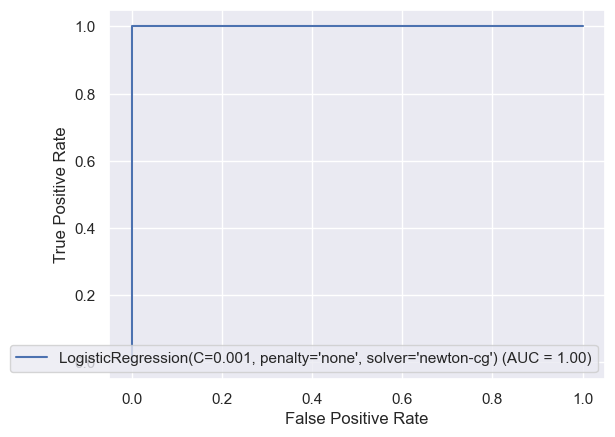

In [90]:
display.plot()

In [91]:
import joblib
joblib.dump(Final_model, "Glass-prediction")

['Glass-prediction']

Predicting the saved model

In [92]:
model=joblib.load("Glass-prediction")

In [93]:
prediction=model.predict(x_test)
prediction

array([0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1,
       0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0,
       1, 1, 1, 1, 1], dtype=int64)

In [94]:
a=np.array(y_test)
df=pd.DataFrame()
df['predicted']=prediction
df['original']=a
df

,predicted,original
0,0,0
1,1,1
2,0,0
3,1,1
4,0,0
...,...,...
88,1,1
89,1,1
90,1,1
91,1,1


# Student grades prediction

In [95]:
df=pd.read_csv("https://raw.githubusercontent.com/FlipRoboTechnologies/ML-Datasets/main/Grades/Grades.csv")

In [96]:
df.head()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448


Exploratory Data Analysis

In [97]:
df.shape

(571, 43)

The dataset contains 571 rows and 43 columns, out of which "CGPA" is the target variable.

In [98]:
df.isnull().sum()

Seat No.      0
PH-121        0
HS-101        0
CY-105        1
HS-105/12     1
MT-111        2
CS-105        0
CS-106        2
EL-102        2
EE-119        2
ME-107        2
CS-107        2
HS-205/20     5
MT-222        5
EE-222        7
MT-224        7
CS-210        7
CS-211        5
CS-203        5
CS-214        6
EE-217        6
CS-212        6
CS-215        6
MT-331        9
EF-303       10
HS-304       10
CS-301       10
CS-302       10
TC-383       10
MT-442       10
EL-332        9
CS-318        9
CS-306        9
CS-312       10
CS-317       12
CS-403       12
CS-421       12
CS-406       85
CS-414       13
CS-419       13
CS-423       14
CS-412       79
CGPA          0
dtype: int64

<Axes: >

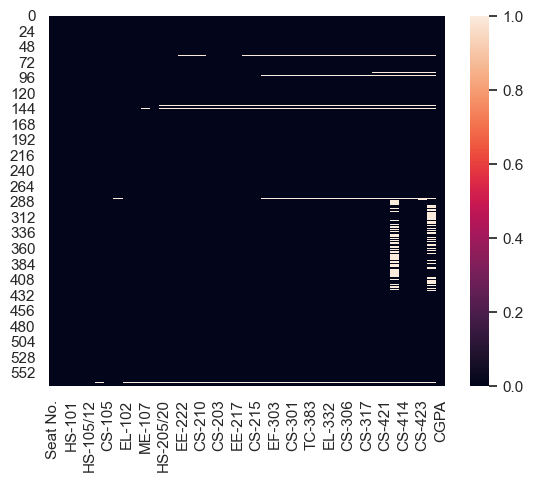

In [99]:
sns.heatmap(df.isnull())

In [100]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 571 entries, 0 to 570
Data columns (total 43 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Seat No.   571 non-null    object 
 1   PH-121     571 non-null    object 
 2   HS-101     571 non-null    object 
 3   CY-105     570 non-null    object 
 4   HS-105/12  570 non-null    object 
 5   MT-111     569 non-null    object 
 6   CS-105     571 non-null    object 
 7   CS-106     569 non-null    object 
 8   EL-102     569 non-null    object 
 9   EE-119     569 non-null    object 
 10  ME-107     569 non-null    object 
 11  CS-107     569 non-null    object 
 12  HS-205/20  566 non-null    object 
 13  MT-222     566 non-null    object 
 14  EE-222     564 non-null    object 
 15  MT-224     564 non-null    object 
 16  CS-210     564 non-null    object 
 17  CS-211     566 non-null    object 
 18  CS-203     566 non-null    object 
 19  CS-214     565 non-null    object 
 20  EE-217    

There are so many null values present in our dataset.

In [101]:
df['CS-406'].value_counts()

A-    177
A      79
B+     64
B      58
B-     22
C+     22
C      19
D+     14
C-      8
A+      8
F       6
D       5
W       3
WU      1
Name: CS-406, dtype: int64

In [102]:
df['CS-406']=df['CS-406'].fillna('A-')

In [103]:
df['EF-303'].value_counts()

B     112
B-     92
C      61
B+     59
C+     58
C-     56
D+     49
A-     38
D      19
A      14
F       2
WU      1
Name: EF-303, dtype: int64

In [104]:
df['EF-303']=df['EF-303'].fillna('B')

In [105]:
df['HS-304'].value_counts()

A-    128
B      72
B-     70
B+     66
C      58
C+     53
C-     33
A      28
D      20
D+     19
F       6
A+      4
WU      2
W       2
Name: HS-304, dtype: int64

In [106]:
df['HS-304']=df['HS-304'].fillna('A-')

In [107]:
df['CS-301'].value_counts()

A-    108
B+     74
B      71
A      66
B-     60
C      41
C+     37
C-     36
D      29
D+     29
A+      9
F       1
Name: CS-301, dtype: int64

In [108]:
df['CS-301']=df['CS-301'].fillna('A-')

In [109]:
df['CS-302'].value_counts()

A-    113
B     102
A      86
B+     81
B-     60
C+     32
C      28
D      21
C-     19
D+     10
A+      9
Name: CS-302, dtype: int64

In [110]:
df['CS-302']=df['CS-302'].fillna('A-')

In [111]:
df['TC-383'].value_counts()

A     105
A-     73
B+     68
B      59
C+     44
D+     44
C-     42
C      42
B-     40
A+     23
D      20
F       1
Name: TC-383, dtype: int64

In [112]:
df['TC-383']=df['TC-383'].fillna('A')

In [113]:
df['MT-442'].value_counts()

A-    140
A     130
B+     65
B      47
A+     39
B-     30
C-     28
C+     24
C      24
D      20
D+     13
F       1
Name: MT-442, dtype: int64

In [114]:
df['MT-442']=df['MT-442'].fillna('A-')

In [115]:
df['CS-312'].value_counts()

A+    93
A     86
A-    63
D+    52
C     48
C-    44
B+    42
B     37
C+    37
B-    36
D     19
F      2
W      1
WU     1
Name: CS-312, dtype: int64

In [116]:
df['CS-312']=df['CS-312'].fillna('A+')

In [117]:
df['CS-317'].value_counts()

B-    79
B     75
C     70
A-    66
B+    58
C+    57
A     47
C-    41
D+    34
D     16
A+     9
F      7
Name: CS-317, dtype: int64

In [118]:
df['CS-317']=df['CS-317'].fillna('B-')

In [119]:
df['CS-403'].value_counts()

A     133
A-    106
B+     62
B-     55
B      54
D+     35
C      33
C+     32
C-     30
A+     15
D       4
Name: CS-403, dtype: int64

In [120]:
df['CS-403']=df['CS-403'].fillna('A')

In [121]:
df['CS-421'].value_counts()

B     86
B-    74
C     68
C+    61
C-    60
B+    60
A-    47
D+    36
A     25
D     21
F     17
A+     2
W      2
Name: CS-421, dtype: int64

In [122]:
df['CS-421']=df['CS-421'].fillna('B')

In [123]:
df['CS-414'].value_counts()

A     176
A-    156
B+     62
B      54
B-     21
A+     21
C+     21
C      20
C-     12
F       7
D+      3
D       3
W       2
Name: CS-414, dtype: int64

In [124]:
df['CS-414']=df['CS-414'].fillna('A')

In [125]:
df['CS-419'].value_counts()

A-    120
B      89
B+     85
B-     78
A      56
C+     46
C      40
C-     20
D+     13
D       7
A+      2
F       2
Name: CS-419, dtype: int64

In [126]:
df['CS-419']=df['CS-419'].fillna('A-')

In [127]:
df['CS-423'].value_counts()

A-    122
A      78
B+     75
B      65
B-     56
C      45
C+     39
C-     29
D+     25
D      15
F       5
A+      3
Name: CS-423, dtype: int64

In [128]:
df['CS-423']=df['CS-423'].fillna('A-')

In [129]:
df['CS-412'].value_counts()

A-    157
B+     80
A      77
B      65
B-     37
C+     24
C      19
D+      8
C-      7
F       6
D       5
A+      4
W       3
Name: CS-412, dtype: int64

In [130]:
df['CS-412']=df['CS-412'].fillna('A-')

In [131]:
df.dropna(inplace=True)

In [132]:
df.isnull().sum()

Seat No.     0
PH-121       0
HS-101       0
CY-105       0
HS-105/12    0
MT-111       0
CS-105       0
CS-106       0
EL-102       0
EE-119       0
ME-107       0
CS-107       0
HS-205/20    0
MT-222       0
EE-222       0
MT-224       0
CS-210       0
CS-211       0
CS-203       0
CS-214       0
EE-217       0
CS-212       0
CS-215       0
MT-331       0
EF-303       0
HS-304       0
CS-301       0
CS-302       0
TC-383       0
MT-442       0
EL-332       0
CS-318       0
CS-306       0
CS-312       0
CS-317       0
CS-403       0
CS-421       0
CS-406       0
CS-414       0
CS-419       0
CS-423       0
CS-412       0
CGPA         0
dtype: int64

Now, we have imputed the values and removed the null values.

In [133]:
#Dropping Seat No. column from the dataset

df.drop(['Seat No.'],axis=1,inplace=True)

In [134]:
df.head()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,B-,D+,C-,C,C-,D+,D,C-,B-,C-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,A,D,D+,D,B-,C,D,A,D+,D,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,A,B,A,B-,B+,A,B-,B+,A-,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,D,C+,D+,D,D,A-,D+,C-,D,C+,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,A-,A-,A-,B+,A,A,A-,B+,A,A-,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448


In [135]:
for i in df.columns:
    print("Total number of unique values in",i, "column is", df[i].nunique())
    print('\n')

Total number of unique values in PH-121 column is 11


Total number of unique values in HS-101 column is 11


Total number of unique values in CY-105 column is 11


Total number of unique values in HS-105/12 column is 11


Total number of unique values in MT-111 column is 12


Total number of unique values in CS-105 column is 11


Total number of unique values in CS-106 column is 11


Total number of unique values in EL-102 column is 11


Total number of unique values in EE-119 column is 11


Total number of unique values in ME-107 column is 11


Total number of unique values in CS-107 column is 11


Total number of unique values in HS-205/20 column is 11


Total number of unique values in MT-222 column is 12


Total number of unique values in EE-222 column is 12


Total number of unique values in MT-224 column is 12


Total number of unique values in CS-210 column is 12


Total number of unique values in CS-211 column is 12


Total number of unique values in CS-203 column is 11


Tota

# Data Visualisation

Univariate Analysis

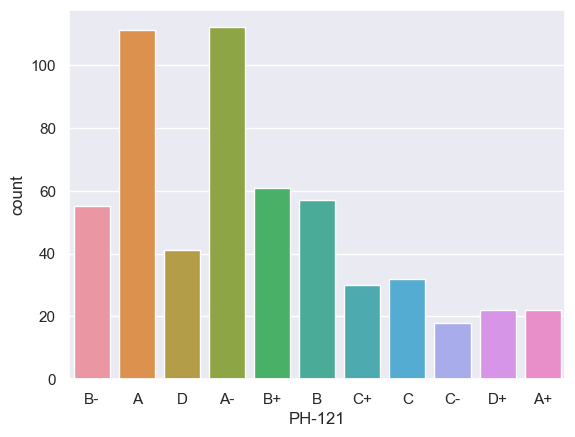

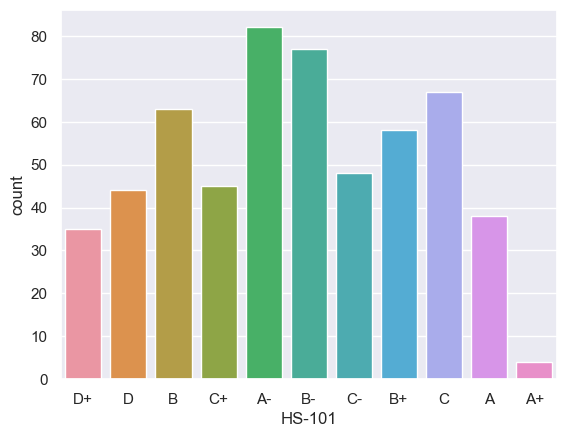

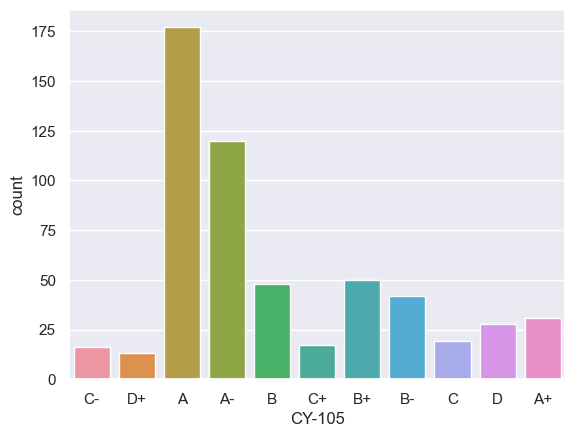

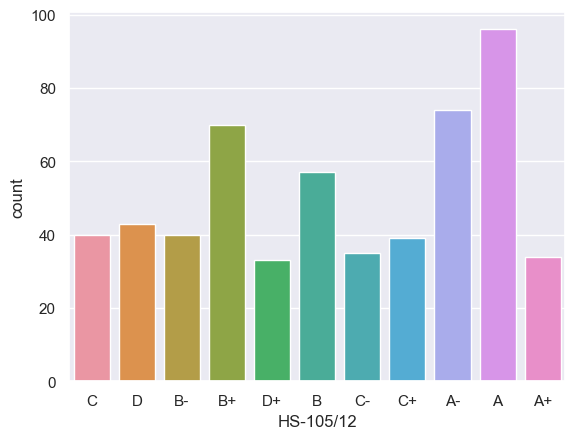

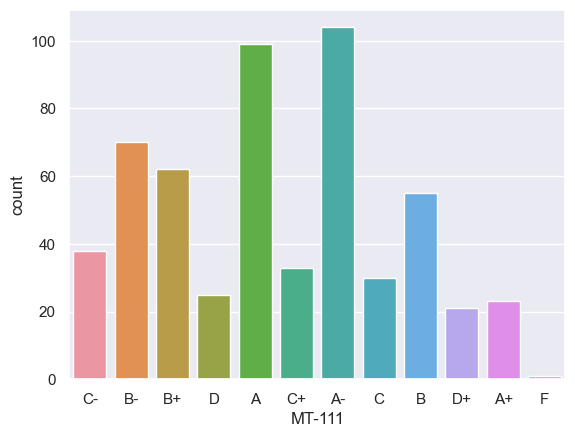

...

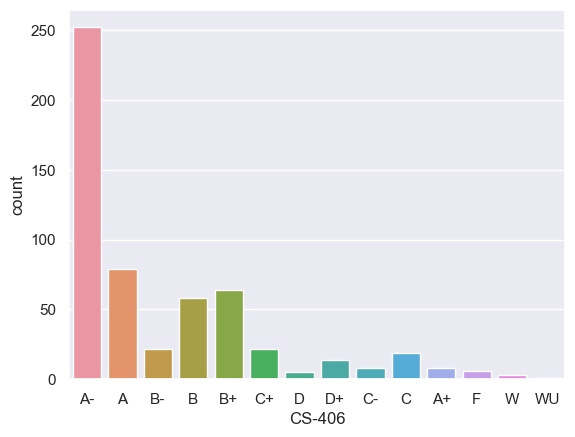

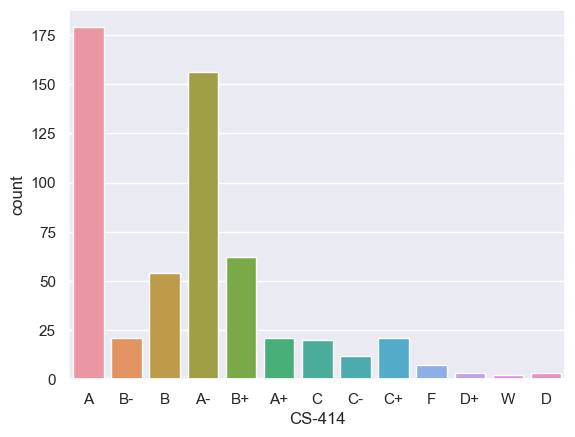

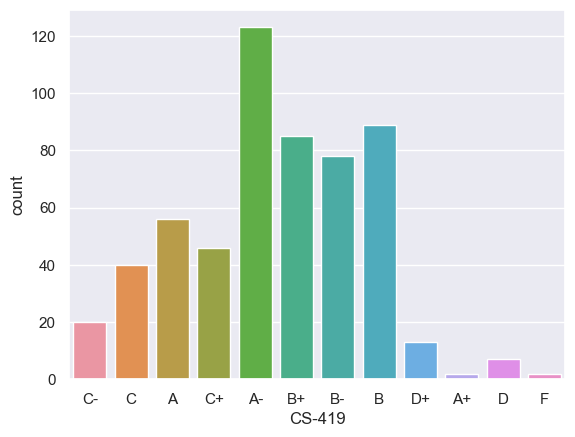

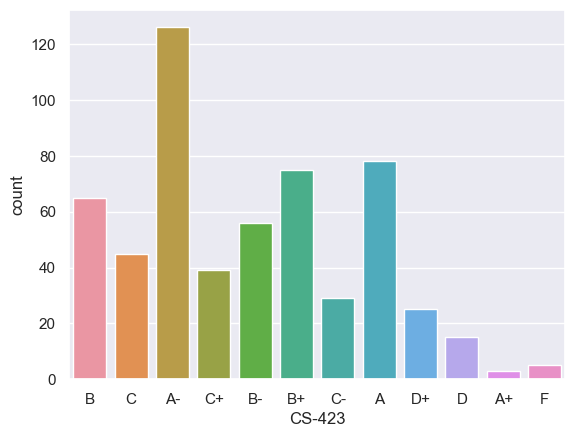

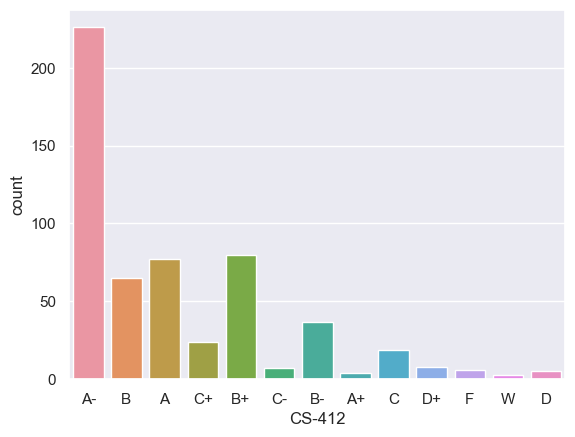

In [136]:
for i in df.drop(['CGPA'], axis=1):
    sns.countplot(x=df[i])
    plt.show()

<Axes: xlabel='CGPA', ylabel='Count'>

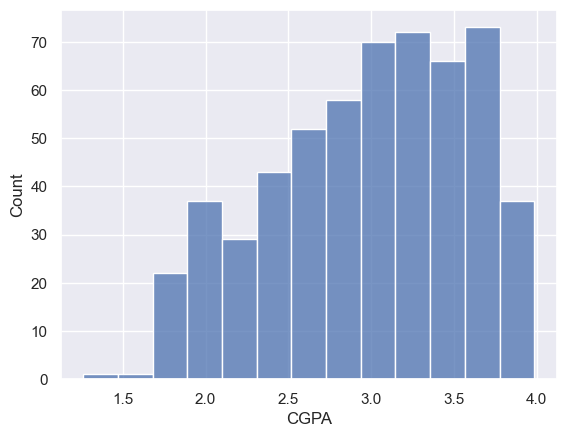

In [137]:
sns.histplot(df['CGPA'])

Bivariate Analysis

Since the datatype is object, hence applying the LabelEncoder method here

In [138]:
from sklearn.preprocessing import LabelEncoder

In [139]:
le=LabelEncoder()
for i in df.drop(['CGPA'],axis=1):
    df[i]=le.fit_transform(df[i])
df

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,5,10,8,6,8,10,9,8,5,8,...,8,8,8,8,2,0,8,3,2,2.205
1,0,9,10,9,5,6,9,0,10,9,...,10,9,6,9,2,5,6,6,3,2.008
2,0,3,0,5,4,0,5,4,2,2,...,3,3,0,6,0,0,0,2,0,3.608
3,9,7,10,9,9,2,10,8,9,7,...,10,6,10,8,5,3,7,7,7,1.906
4,2,2,2,4,0,0,2,4,0,2,...,5,4,4,5,2,0,2,2,0,3.448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,3,0,0,2,1,0,2,2,1,4,...,2,2,0,0,0,4,4,3,0,3.798
567,1,0,0,0,0,0,0,2,0,0,...,4,4,0,0,2,3,2,6,2,3.772
568,3,0,2,4,0,0,0,0,0,3,...,2,3,0,4,0,6,4,2,2,3.470
569,0,4,9,0,9,10,5,8,5,8,...,9,3,3,8,9,6,3,5,6,2.193


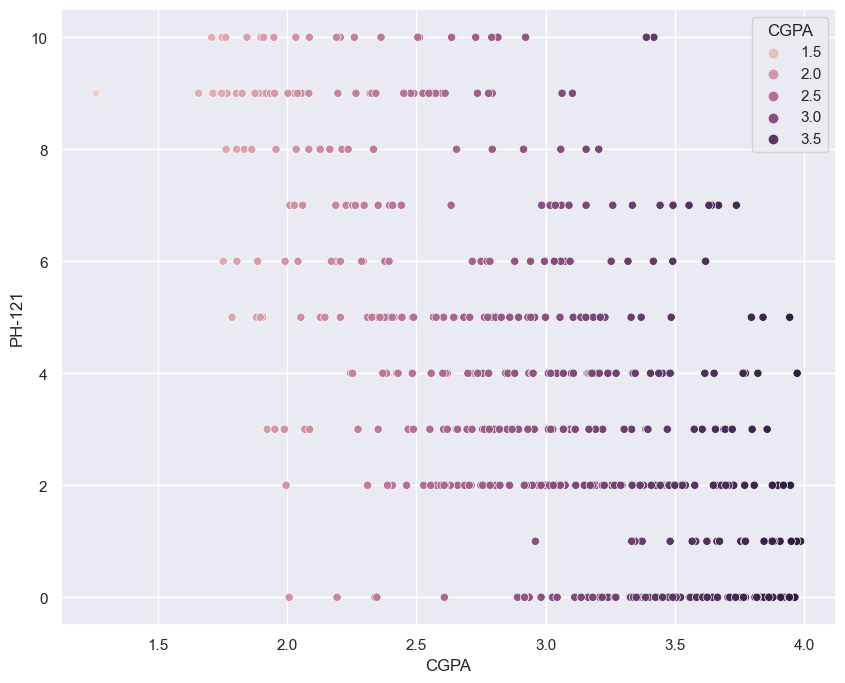

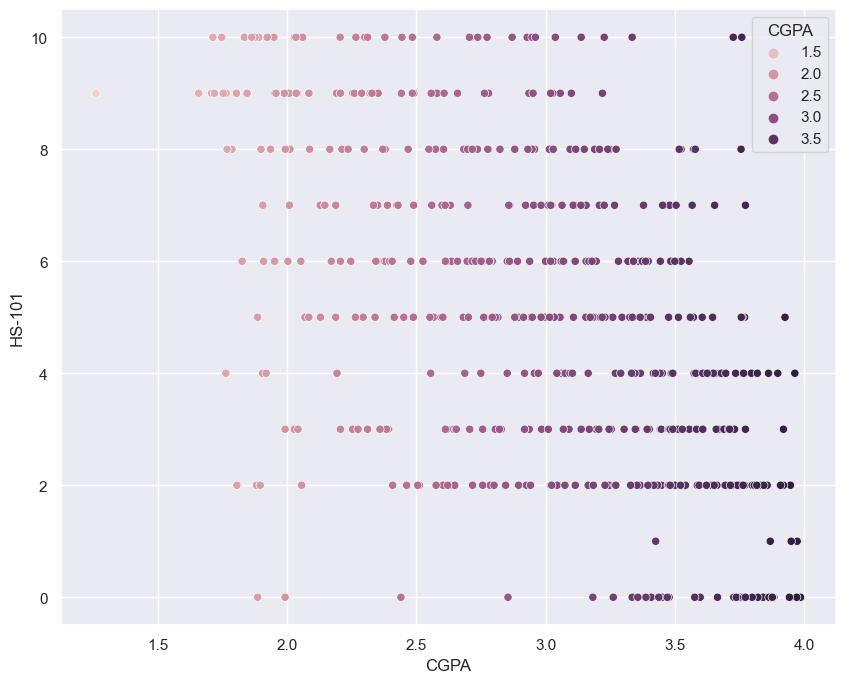

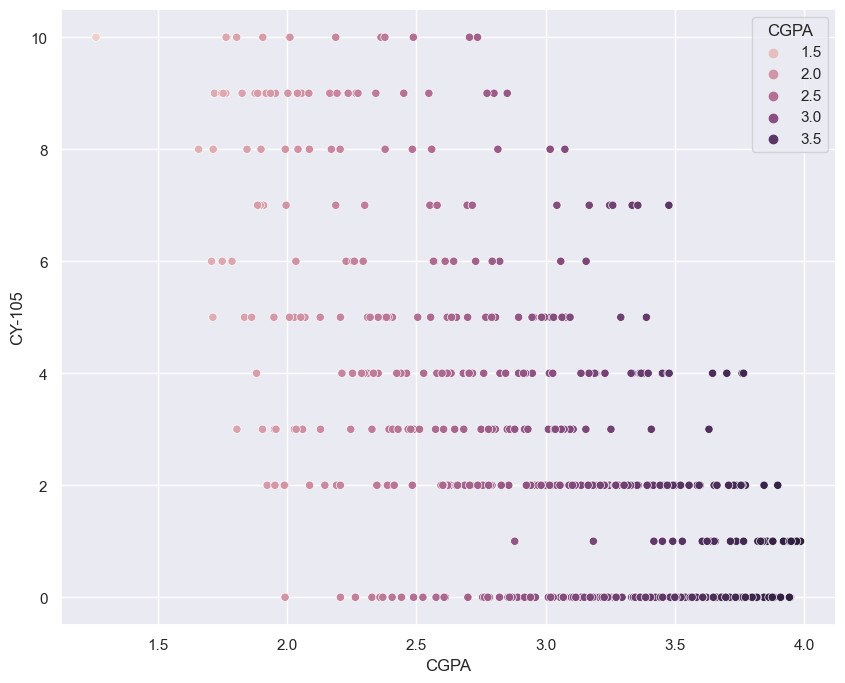

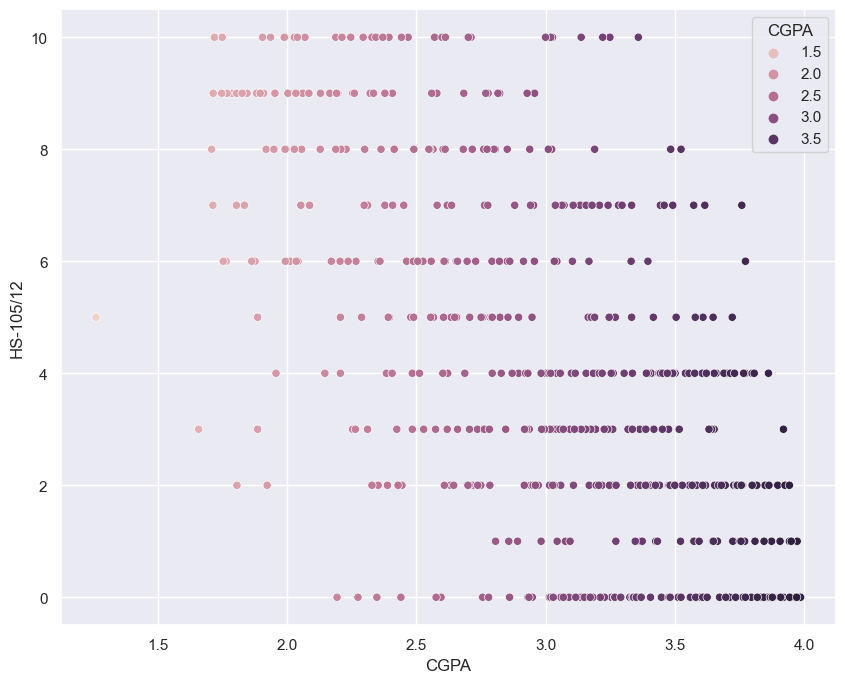

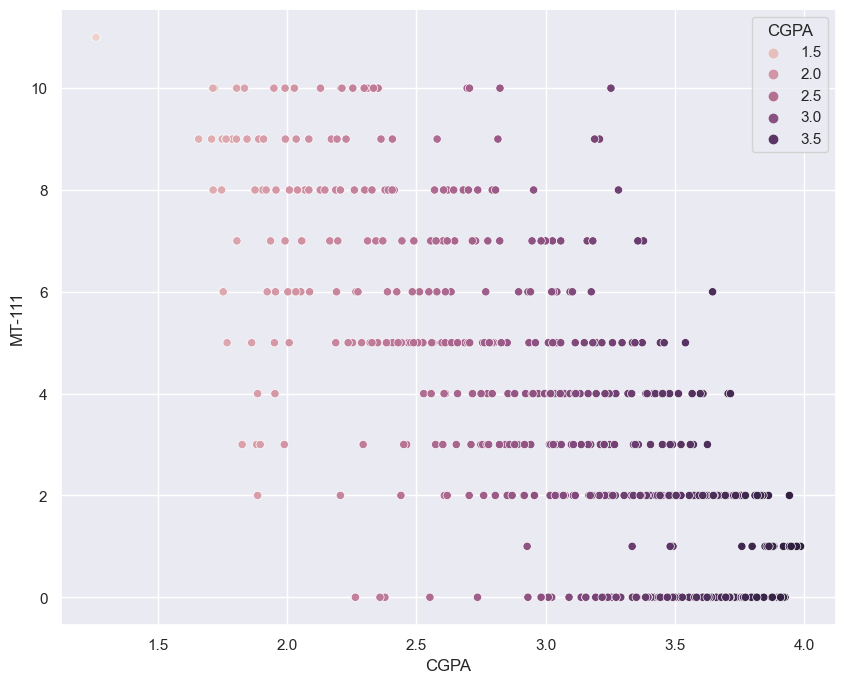

...

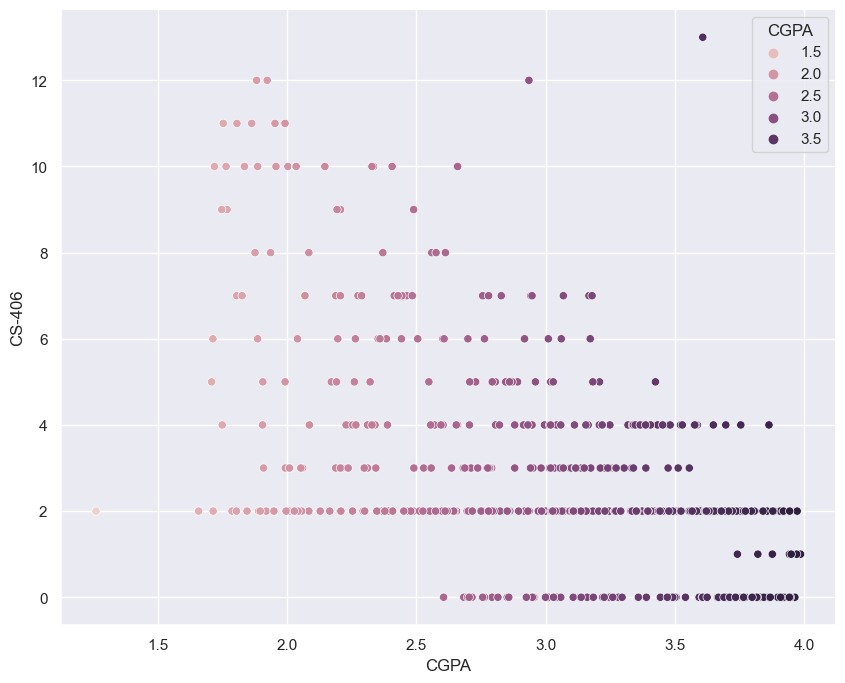

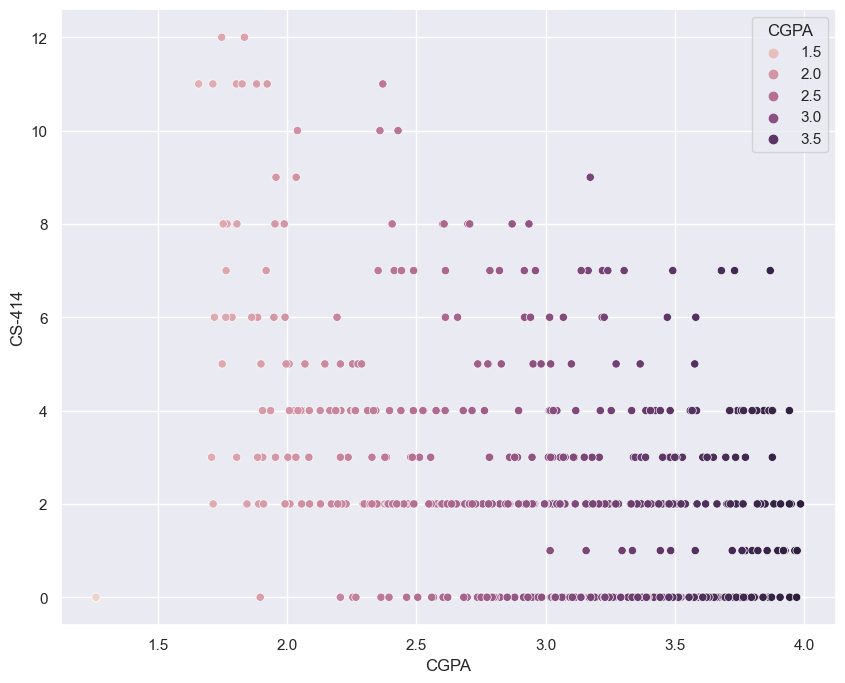

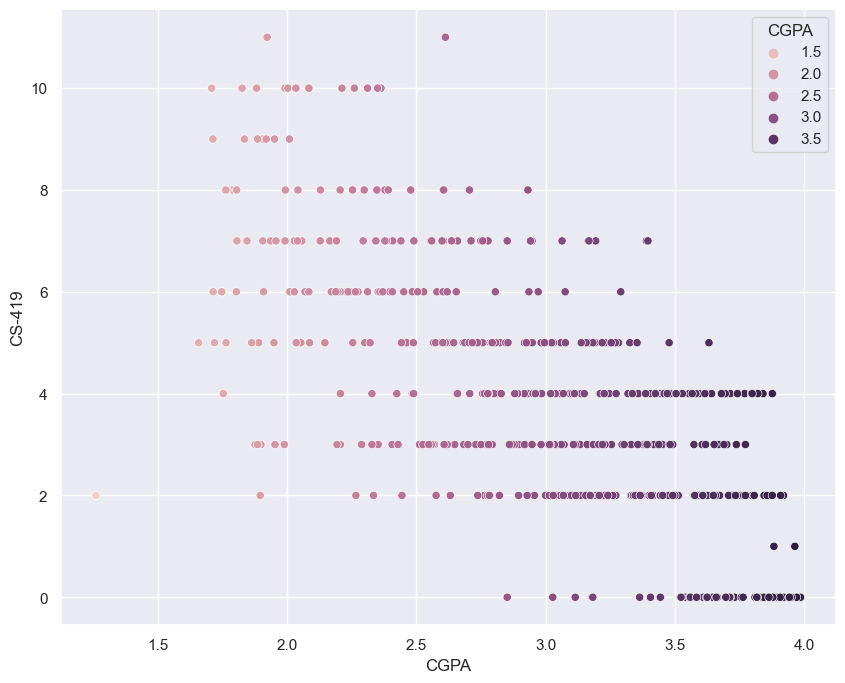

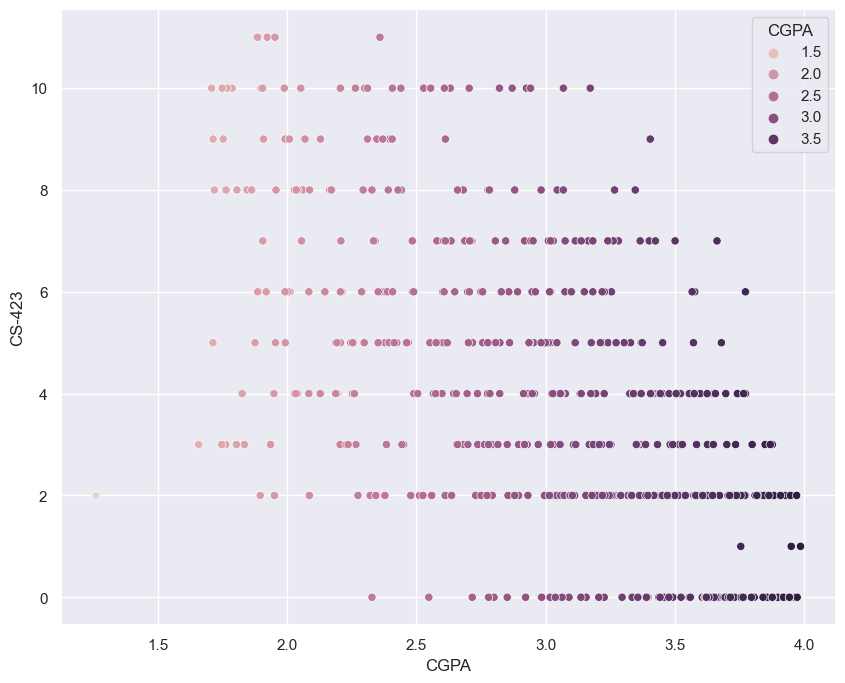

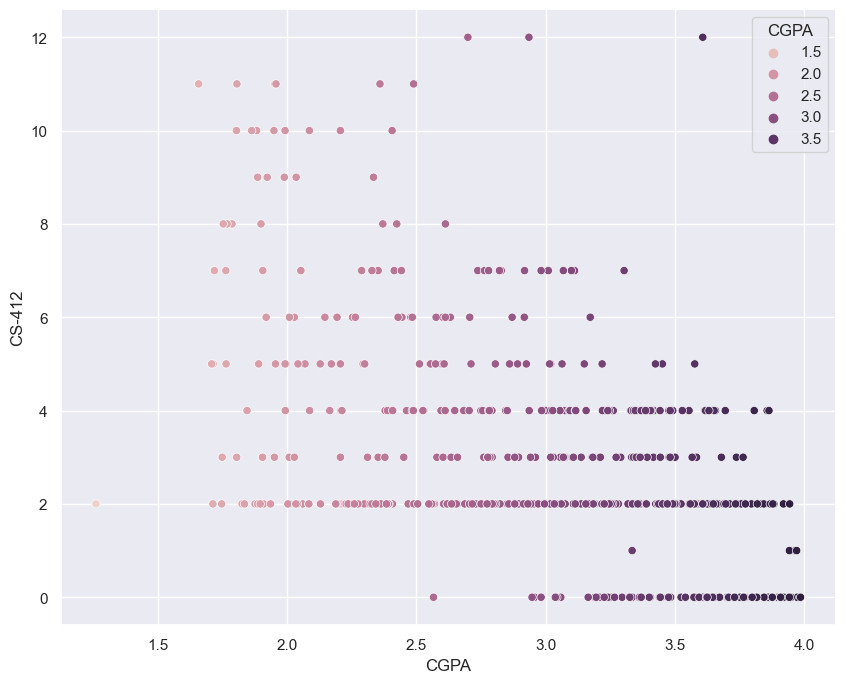

In [140]:
for i in df.drop(['CGPA'],axis=1):
    plt.figure(figsize=(10,8))
    sns.scatterplot(x=df['CGPA'],y=df[i],hue=df['CGPA'])
    plt.show()

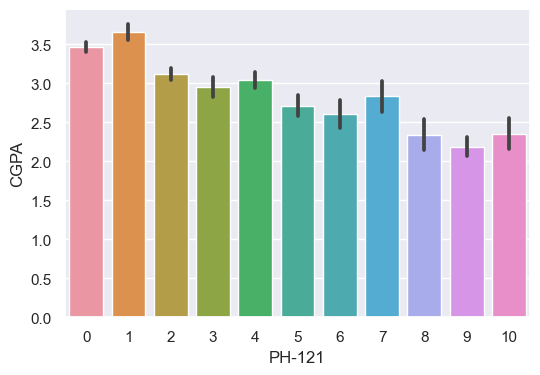

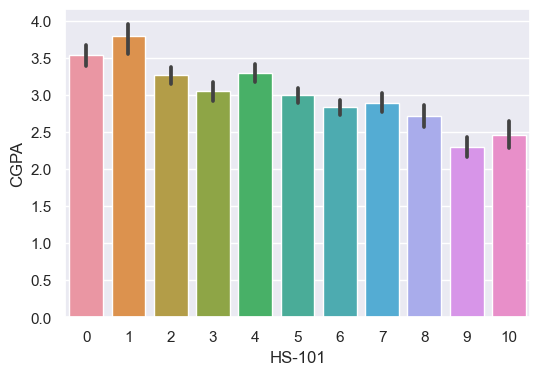

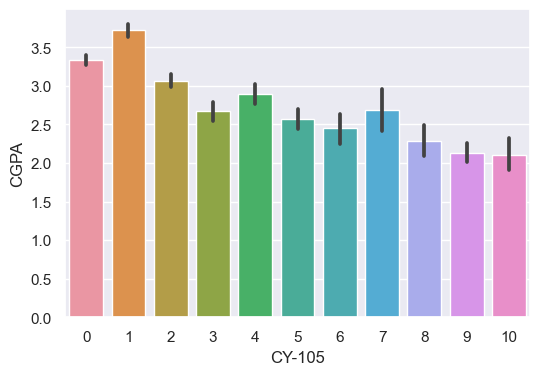

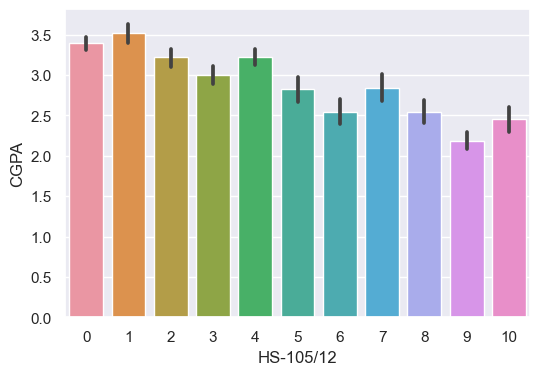

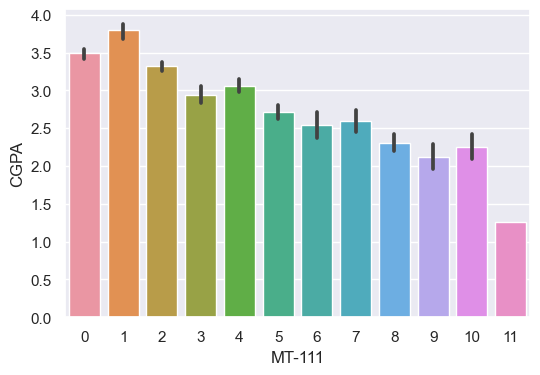

...

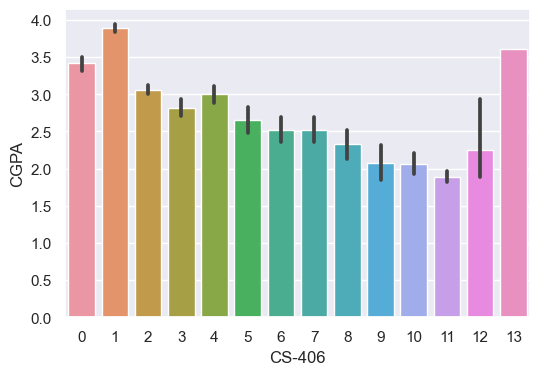

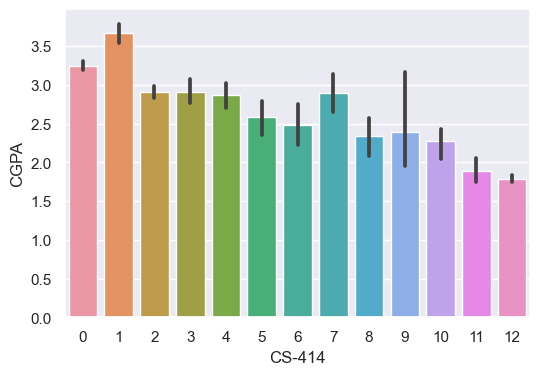

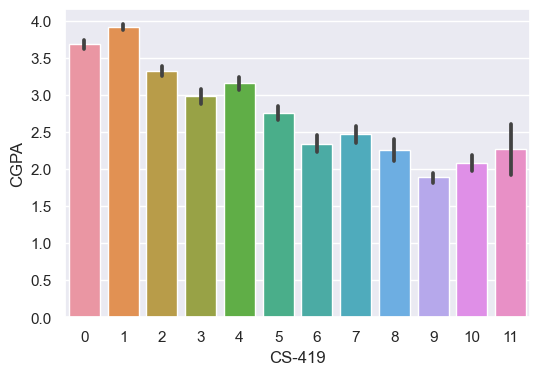

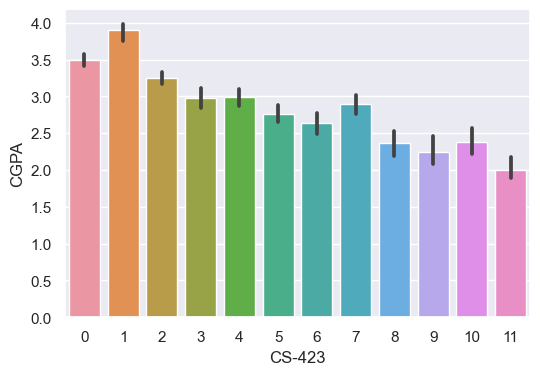

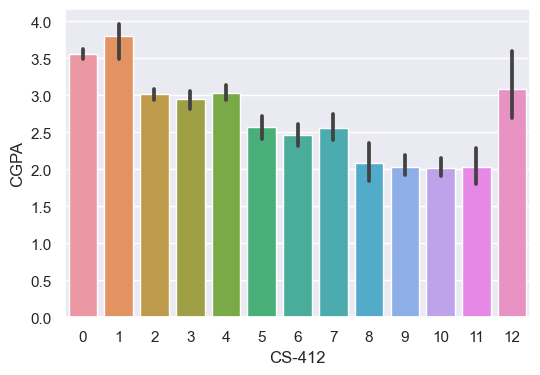

In [141]:
for i in df.drop(['CGPA'],axis=1):
    plt.figure(figsize=(6,4))
    sns.barplot(x=df[i],y=df['CGPA'],data=df)
    plt.show()

Multivariate Analysis

In [142]:
df.corr()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
PH-121,1.000000,0.364662,0.542480,0.489461,0.457760,0.590384,0.278479,0.408450,0.580460,0.526575,...,0.065410,0.476340,0.368667,0.327924,0.301207,0.187699,0.503203,0.119664,0.316964,-0.642891
HS-101,0.364662,1.000000,0.318734,0.466245,0.429801,0.383307,0.307744,0.345745,0.303358,0.327945,...,0.228937,0.367613,0.250034,0.321463,0.275355,0.245779,0.301938,0.242951,0.236217,-0.525553
CY-105,0.542480,0.318734,1.000000,0.478800,0.519495,0.568184,0.349782,0.421849,0.484034,0.462803,...,0.298765,0.494913,0.525173,0.403245,0.151716,0.044900,0.484092,0.153844,0.085047,-0.647309
HS-105/12,0.489461,0.466245,0.478800,1.000000,0.475902,0.474835,0.485935,0.341497,0.409673,0.312481,...,0.283881,0.489800,0.486041,0.447928,0.181047,0.167917,0.496238,0.256895,0.166924,-0.614840
MT-111,0.457760,0.429801,0.519495,0.475902,1.000000,0.381212,0.491839,0.543150,0.403776,0.462213,...,0.509412,0.572161,0.455681,0.548722,0.318325,0.256619,0.536780,0.429186,0.287769,-0.744468
CS-105,0.590384,0.383307,0.568184,0.474835,0.381212,1.000000,0.276018,0.345009,0.498891,0.440830,...,0.083275,0.397862,0.319673,0.269655,0.256310,0.153554,0.339665,0.066309,0.198109,-0.583631
CS-106,0.278479,0.307744,0.349782,0.485935,0.491839,0.276018,1.000000,0.316386,0.286380,0.286875,...,0.489331,0.427427,0.470442,0.429159,0.141503,0.132402,0.452287,0.365533,0.200543,-0.541780
EL-102,0.408450,0.345745,0.421849,0.341497,0.543150,0.345009,0.316386,1.000000,0.454893,0.460814,...,0.338204,0.480480,0.348618,0.406521,0.272197,0.277301,0.414231,0.401338,0.286203,-0.652520
EE-119,0.580460,0.303358,0.484034,0.409673,0.403776,0.498891,0.286380,0.454893,1.000000,0.560468,...,0.176641,0.454772,0.372093,0.380161,0.309460,0.232167,0.488164,0.259521,0.333823,-0.650335
ME-107,0.526575,0.327945,0.462803,0.312481,0.462213,0.440830,0.286875,0.460814,0.560468,1.000000,...,0.216019,0.472185,0.362915,0.372211,0.315541,0.176587,0.467242,0.239895,0.309134,-0.661765


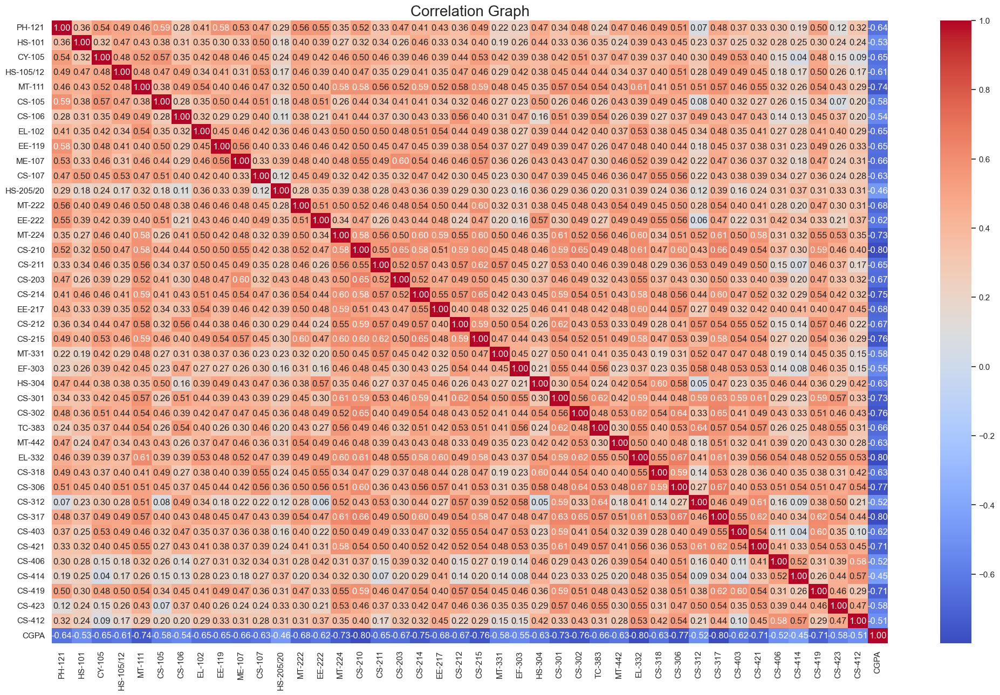

In [143]:
plt.figure(figsize=(25,15))
sns.heatmap(df.corr(), annot=True, fmt='0.2f',linecolor='black', cmap='coolwarm')
plt.title("Correlation Graph", fontsize=20)
plt.show()

In [144]:
df.describe()

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
count,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,...,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000,561.000000
mean,3.691622,5.028520,2.795009,4.176471,3.841355,2.766488,4.069519,3.884135,3.855615,4.723708,...,4.108734,4.832442,3.477718,5.427807,3.001783,2.440285,3.889483,4.001783,3.067736,2.977501
std,2.983182,2.777314,2.840846,3.148562,2.919418,2.639809,2.674045,2.960293,2.622466,3.102469,...,3.356861,2.764652,2.965869,2.734478,2.486750,2.500803,2.390886,2.807833,2.348794,0.594160
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.261000
25%,2.000000,3.000000,0.000000,2.000000,2.000000,0.000000,2.000000,2.000000,2.000000,2.000000,...,1.000000,3.000000,1.000000,3.000000,2.000000,0.000000,2.000000,2.000000,2.000000,2.564000
50%,3.000000,5.000000,2.000000,4.000000,3.000000,2.000000,4.000000,3.000000,3.000000,4.000000,...,4.000000,5.000000,3.000000,5.000000,2.000000,2.000000,4.000000,4.000000,2.000000,3.042000
75%,6.000000,7.000000,4.000000,7.000000,6.000000,4.000000,5.000000,6.000000,6.000000,7.000000,...,7.000000,7.000000,5.000000,7.000000,4.000000,4.000000,5.000000,6.000000,4.000000,3.458000
max,10.000000,10.000000,10.000000,10.000000,11.000000,10.000000,10.000000,10.000000,10.000000,10.000000,...,13.000000,11.000000,10.000000,12.000000,13.000000,12.000000,11.000000,11.000000,12.000000,3.985000


Seperating Features and Label

In [145]:
x=df.drop(['CGPA'],axis=1)
y=df['CGPA']

Scaling Input Data

In [146]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[ 0.43897606,  1.79162927,  1.83383298, ...,  1.72077861,
        -0.35709981, -0.45499486],
       [-1.23858231,  1.43124776,  2.53847703, ...,  0.88352206,
         0.71229339, -0.02886445],
       [-1.23858231, -0.73104127, -0.98474319, ..., -1.62824758,
        -0.71356421, -1.30725569],
       ...,
       [-0.23204729, -1.81218579, -0.28009915, ...,  0.04626551,
        -0.71356421, -0.45499486],
       [-1.23858231, -0.37065977,  2.18615501, ..., -0.37236276,
         0.35582899,  1.24952679],
       [ 0.77448773,  1.43124776,  2.18615501, ...,  0.04626551,
         1.78168659,  2.10178761]])

# Modelling

In [147]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression

In [148]:
MaxAccu = 0
MaxRS=0
for i in range(0,200):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=i)
    LR=LinearRegression()
    LR.fit(x_train, y_train)
    pred = LR.predict(x_test)
    acc = r2_score(y_test, pred)
    if acc>MaxAccu:
        MaxAccu = acc
        MaxRS = i
print("Max r2 score is: ",MaxAccu, "at random state", MaxRS)

Max r2 score is:  0.9908029354664194 at random state 3


Creating Test Train Split

In [149]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=MaxRS)

In [150]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge

In [151]:
LR=LinearRegression()
LR.fit(x_train, y_train)
predLR=LR.predict(x_test)
pred_Train=LR.predict(x_train)
print("r2 score:",r2_score(y_test, predLR))
print("r2 score on training data:",r2_score(y_train, pred_Train)*100)
print("Mean absolute error:",mean_absolute_error(y_test, predLR))
print("Mean squared error:",mean_squared_error(y_test, predLR))
print("Root Mean squared error:",np.sqrt(mean_squared_error(y_test, predLR)))

r2 score: 0.9908029354664194
r2 score on training data: 98.68067599217244
Mean absolute error: 0.04375562675388266
Mean squared error: 0.003373388402138884
Root Mean squared error: 0.05808087811094874


In [152]:
RFR=RandomForestRegressor()
RFR.fit(x_train, y_train)
predRFR=RFR.predict(x_test)
pred_Train=RFR.predict(x_train)
print("r2 score:",r2_score(y_test, predRFR))
print("r2 score on training data:",r2_score(y_train, pred_Train)*100)
print("Mean absolute error:",mean_absolute_error(y_test, predRFR))
print("Mean squared error:",mean_squared_error(y_test, predRFR))
print("Root Mean squared error:",np.sqrt(mean_squared_error(y_test, predRFR)))

r2 score: 0.9505723389624409
r2 score on training data: 99.21901041688082
Mean absolute error: 0.0952853254437871
Mean squared error: 0.018129556216568078
Root Mean squared error: 0.1346460404786122


In [153]:
knn=KNN()
knn.fit(x_train, y_train)
predknn=knn.predict(x_test)
pred_Train=knn.predict(x_train)
print("r2 score:",r2_score(y_test, predknn))
print("r2 score on training data:",r2_score(y_train, pred_Train)*100)
print("Mean absolute error:",mean_absolute_error(y_test, predknn))
print("Mean squared error:",mean_squared_error(y_test, predknn))
print("Root Mean squared error:",np.sqrt(mean_squared_error(y_test, predknn)))

r2 score: 0.9665718184163388
r2 score on training data: 96.95455551845069
Mean absolute error: 0.08527218934911245
Mean squared error: 0.012261112189349116
Root Mean squared error: 0.1107299064812624


In [154]:
GBR=GradientBoostingRegressor()
GBR.fit(x_train, y_train)
predGBR=GBR.predict(x_test)
pred_Train=GBR.predict(x_train)
print("r2 score:",r2_score(y_test, predGBR))
print("r2 score on training data:",r2_score(y_train, pred_Train)*100)
print("Mean absolute error:",mean_absolute_error(y_test, predGBR))
print("Mean squared error:",mean_squared_error(y_test, predGBR))
print("Root Mean squared error:",np.sqrt(mean_squared_error(y_test, predknn)))

r2 score: 0.9670509886040689
r2 score on training data: 99.74676400623855
Mean absolute error: 0.07920364505198102
Mean squared error: 0.012085357507185285
Root Mean squared error: 0.1107299064812624


In [155]:
DTR=DecisionTreeRegressor()
DTR.fit(x_train, y_train)
predDTR=DTR.predict(x_test)
pred_Train=DTR.predict(x_train)
print("r2 score:",r2_score(y_test, predDTR))
print("r2 score on training data:",r2_score(y_train, pred_Train)*100)
print("Mean absolute error:",mean_absolute_error(y_test, predDTR))
print("Mean squared error:",mean_squared_error(y_test, predDTR))
print("Root Mean squared error:",np.sqrt(mean_squared_error(y_test, predDTR)))

r2 score: 0.8491633228577427
r2 score on training data: 100.0
Mean absolute error: 0.17273372781065088
Mean squared error: 0.05532533727810651
Root Mean squared error: 0.2352133866898449


In [156]:
lasso=Lasso()
lasso.fit(x_train, y_train)
predlasso=lasso.predict(x_test)
pred_Train=lasso.predict(x_train)
print("r2 score:",r2_score(y_test, predlasso))
print("r2 score on training data:",r2_score(y_train, pred_Train)*100)
print("Mean absolute error:",mean_absolute_error(y_test, predlasso))
print("Mean squared error:",mean_squared_error(y_test, predlasso))
print("Root Mean squared error:",np.sqrt(mean_squared_error(y_test, predlasso)))

r2 score: -4.4362321725444076e-05
r2 score on training data: 0.0
Mean absolute error: 0.5182451394759087
Mean squared error: 0.3668059565269895
Root Mean squared error: 0.6056450747153728


In [157]:
rd=Ridge()
rd.fit(x_train, y_train)
predrd=rd.predict(x_test)
pred_Train=rd.predict(x_train)
print("r2 score:",r2_score(y_test, predrd))
print("r2 score on training data:",r2_score(y_train, pred_Train)*100)
print("Mean absolute error:",mean_absolute_error(y_test, predrd))
print("Mean squared error:",mean_squared_error(y_test, predrd))
print("Root Mean squared error:",np.sqrt(mean_squared_error(y_test, predrd)))

r2 score: 0.9908267705371812
r2 score on training data: 98.68065814826079
Mean absolute error: 0.043692559396979996
Mean squared error: 0.0033646459440449823
Root Mean squared error: 0.058005568215861676


Cross Validation Score

In [158]:
score = cross_val_score(LR, x, y, cv=5, scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is:", r2_score(y_test,predLR) - score.mean())

[0.98377317 0.99214591 0.98171172 0.98542246 0.97992039]
0.9845947286446608
Difference between R2 score and cross validation score is: 0.0062082068217585995


In [159]:
score = cross_val_score(RFR, x, y, cv=5, scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is:", r2_score(y_test,predRFR) - score.mean())

[0.94381025 0.95044203 0.95418842 0.94006205 0.93576557]
0.9448536633800426
Difference between R2 score and cross validation score is: 0.005718675582398247


In [160]:
score = cross_val_score(knn, x, y, cv=5, scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is:", r2_score(y_test,predknn) - score.mean())

[0.96585267 0.95839058 0.96420462 0.96530236 0.93379933]
0.9575099108998597
Difference between R2 score and cross validation score is: 0.009061907516479062


In [161]:
score = cross_val_score(GBR, x, y, cv=5, scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is:", r2_score(y_test,predGBR) - score.mean())

[0.95509668 0.96703447 0.96328135 0.96091613 0.95871512]
0.9610087504363036
Difference between R2 score and cross validation score is: 0.006042238167765279


In [162]:
score = cross_val_score(DTR, x, y, cv=5, scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is:", r2_score(y_test,predDTR) - score.mean())

[0.86244418 0.82093507 0.80290665 0.7565398  0.79584669]
0.8077344769380896
Difference between R2 score and cross validation score is: 0.04142884591965301


In [163]:
score = cross_val_score(lasso, x, y, cv=5, scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is:", r2_score(y_test,predlasso) - score.mean())

[-0.00544748 -0.00616251 -0.00118298 -0.00021321 -0.02958288]
-0.008517812268742198
Difference between R2 score and cross validation score is: 0.008473449947016754


In [164]:
score = cross_val_score(rd, x, y, cv=5, scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is:", r2_score(y_test,predrd) - score.mean())

[0.98379423 0.99216304 0.98174872 0.98543393 0.97994446]
0.9846168774400506
Difference between R2 score and cross validation score is: 0.006209893097130603


In [165]:
from sklearn.model_selection import GridSearchCV

In [166]:
parameters= {'alpha':[0.1,1,10,100,1000], 'max_iter':[50,1000,10000],'solver':['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs']}

In [167]:
GCV=GridSearchCV(Ridge(), parameters, cv=5)

In [168]:
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.1, 1, 10, 100, 1000],
                         'max_iter': [50, 1000, 10000],
                         'solver': ['auto', 'svd', 'cholesky', 'lsqr',
                                    'sparse_cg', 'sag', 'saga', 'lbfgs']})

In [169]:
GCV.best_params_

{'alpha': 100, 'max_iter': 50, 'solver': 'saga'}

In [170]:
Final_model = Ridge(alpha=100,max_iter=50,solver='sag')

In [171]:
Final_model.fit(x_train, y_train)
pred=Final_model.predict(x_test)
acc=r2_score(y_test, pred)
print(acc*100)

99.12937364710137


Saving the model

In [172]:
import joblib
joblib.dump(Final_model, "student_pred")

['student_pred']

Predicting the saved model

In [173]:
model=joblib.load("student_pred")

In [174]:
prediction=model.predict(x_test)
prediction

array([3.64454943, 3.48051678, 2.9283278 , 1.9631181 , 3.23376894,
       1.87366476, 3.41796238, 2.00156164, 3.44983652, 3.68121236,
       3.84715354, 3.41753111, 3.4560145 , 1.97615179, 2.99490811,
       2.5694857 , 3.48765512, 3.35672326, 2.71263038, 1.99800622,
       3.62751439, 2.55884014, 1.76108347, 3.11760503, 3.2564613 ,
       3.53700878, 1.89075056, 2.64355224, 1.82492542, 2.32202627,
       2.72678025, 3.8080789 , 3.53926823, 3.43368762, 3.24136949,
       2.29859659, 3.9120623 , 2.46636076, 2.17760302, 3.42874978,
       1.96615473, 2.43804566, 3.99080097, 3.06208386, 3.80583128,
       2.68277282, 2.84618595, 2.7073787 , 2.90544897, 2.94212681,
       3.61819835, 2.27174241, 3.79667241, 2.58261426, 3.17977124,
       2.15531096, 3.12401658, 3.56116598, 2.11549868, 3.39304782,
       2.67750251, 2.4968753 , 3.37372413, 3.85916242, 3.11872729,
       3.7316371 , 2.68681789, 2.80214429, 1.91817956, 3.32171575,
       3.32694858, 2.98186965, 2.61492376, 2.12561341, 3.20197

In [175]:
a=np.array(y_test)
df=pd.DataFrame()
df['predicted']=prediction
df['original']=a
df

,predicted,original
0,3.644549,3.651
1,3.480517,3.523
2,2.928328,2.984
3,1.963118,2.009
4,3.233769,3.226
...,...,...
164,2.813710,2.777
165,2.148178,2.188
166,3.552842,3.540
167,2.450321,2.462


# BANK MARKETING

In [176]:
df=pd.read_csv("https://raw.githubusercontent.com/FlipRoboTechnologies/ML-Datasets/main/Bank%20Marketing/termdeposit_train.csv")

In [177]:
df.head()

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,26110,56,admin.,married,unknown,no,1933,no,no,telephone,19,nov,44,2,-1,0,unknown,no
1,40576,31,unknown,married,secondary,no,3,no,no,cellular,20,jul,91,2,-1,0,unknown,no
2,15320,27,services,married,secondary,no,891,yes,no,cellular,18,jul,240,1,-1,0,unknown,no
3,43962,57,management,divorced,tertiary,no,3287,no,no,cellular,22,jun,867,1,84,3,success,yes
4,29842,31,technician,married,secondary,no,119,yes,no,cellular,4,feb,380,1,-1,0,unknown,no


Exploratory Data Analysis

In [178]:
df.shape

(31647, 18)

In [179]:
df.isnull().sum()

ID            0
age           0
job           0
marital       0
education     0
default       0
balance       0
housing       0
loan          0
contact       0
day           0
month         0
duration      0
campaign      0
pdays         0
previous      0
poutcome      0
subscribed    0
dtype: int64

In [180]:
df.columns.tolist()

['ID',
 'age',
 'job',
 'marital',
 'education',
 'default',
 'balance',
 'housing',
 'loan',
 'contact',
 'day',
 'month',
 'duration',
 'campaign',
 'pdays',
 'previous',
 'poutcome',
 'subscribed']

In [181]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31647 entries, 0 to 31646
Data columns (total 18 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   ID          31647 non-null  int64 
 1   age         31647 non-null  int64 
 2   job         31647 non-null  object
 3   marital     31647 non-null  object
 4   education   31647 non-null  object
 5   default     31647 non-null  object
 6   balance     31647 non-null  int64 
 7   housing     31647 non-null  object
 8   loan        31647 non-null  object
 9   contact     31647 non-null  object
 10  day         31647 non-null  int64 
 11  month       31647 non-null  object
 12  duration    31647 non-null  int64 
 13  campaign    31647 non-null  int64 
 14  pdays       31647 non-null  int64 
 15  previous    31647 non-null  int64 
 16  poutcome    31647 non-null  object
 17  subscribed  31647 non-null  object
dtypes: int64(8), object(10)
memory usage: 4.3+ MB


In [182]:
for i in df.columns:
    print(df[i].value_counts())
    print('\n')

26110    1
13339    1
39681    1
15135    1
26037    1
        ..
1247     1
15584    1
25376    1
38699    1
14156    1
Name: ID, Length: 31647, dtype: int64


32    1457
31    1417
33    1406
34    1321
35    1314
      ... 
92       1
95       1
93       1
94       1
90       1
Name: age, Length: 76, dtype: int64


blue-collar      6842
management       6639
technician       5307
admin.           3631
services         2903
retired          1574
self-employed    1123
entrepreneur     1008
unemployed        905
housemaid         874
student           635
unknown           206
Name: job, dtype: int64


married     19095
single       8922
divorced     3630
Name: marital, dtype: int64


secondary    16224
tertiary      9301
primary       4808
unknown       1314
Name: education, dtype: int64


no     31062
yes      585
Name: default, dtype: int64


 0        2470
 1         137
 2         109
 4          95
 3          88
          ... 
 15120       1
-713         1
-905         1
 4722  

In [183]:
df.drop(['ID'],axis=1,inplace=True)
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,56,admin.,married,unknown,no,1933,no,no,telephone,19,nov,44,2,-1,0,unknown,no
1,31,unknown,married,secondary,no,3,no,no,cellular,20,jul,91,2,-1,0,unknown,no
2,27,services,married,secondary,no,891,yes,no,cellular,18,jul,240,1,-1,0,unknown,no
3,57,management,divorced,tertiary,no,3287,no,no,cellular,22,jun,867,1,84,3,success,yes
4,31,technician,married,secondary,no,119,yes,no,cellular,4,feb,380,1,-1,0,unknown,no


In [184]:
for i in df.columns:
    print("Total unique values in", i, "is", df[i].nunique())
    print('\n')

Total unique values in age is 76


Total unique values in job is 12


Total unique values in marital is 3


Total unique values in education is 4


Total unique values in default is 2


Total unique values in balance is 6326


Total unique values in housing is 2


Total unique values in loan is 2


Total unique values in contact is 3


Total unique values in day is 31


Total unique values in month is 12


Total unique values in duration is 1454


Total unique values in campaign is 45


Total unique values in pdays is 509


Total unique values in previous is 38


Total unique values in poutcome is 4


Total unique values in subscribed is 2




# Data Visualisation

Univariate Analysis

In [185]:
sns.set()

In [186]:
categorical_col= []
for i in df.dtypes.index:
    if df.dtypes[i] == object:
        categorical_col.append(i)
        
print('Categorical Coulmns:', categorical_col)
print("\n")

numerical_col= []
for i in df.dtypes.index:
    if df.dtypes[i] != object:
        numerical_col.append(i)
        
print('Numerical columns:', numerical_col)

Categorical Coulmns: ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome', 'subscribed']


Numerical columns: ['age', 'balance', 'day', 'duration', 'campaign', 'pdays', 'previous']


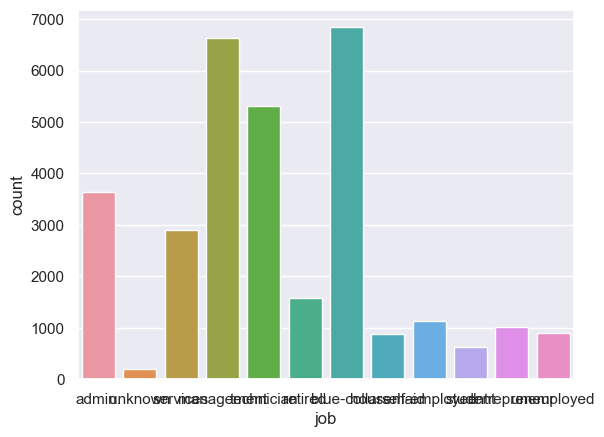

<Figure size 800x600 with 0 Axes>

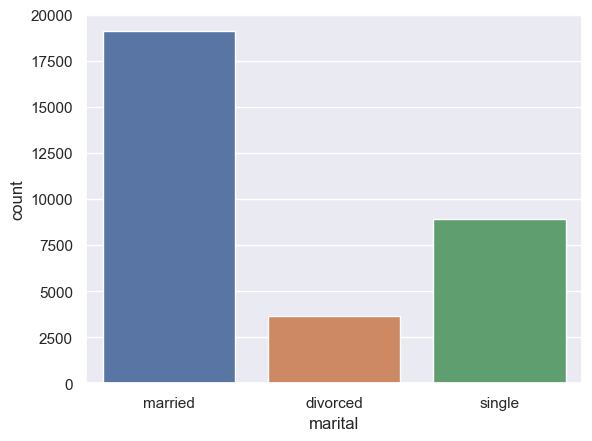

<Figure size 800x600 with 0 Axes>

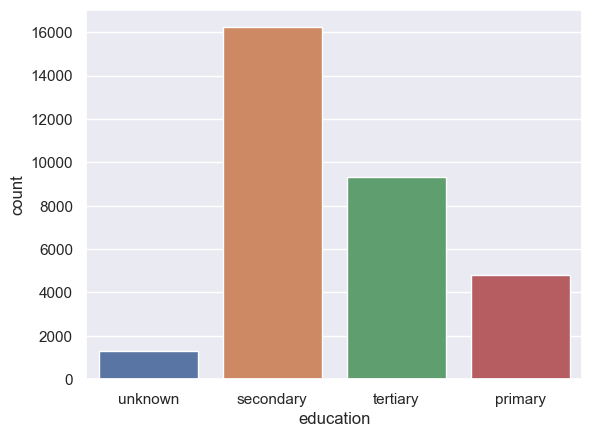

<Figure size 800x600 with 0 Axes>

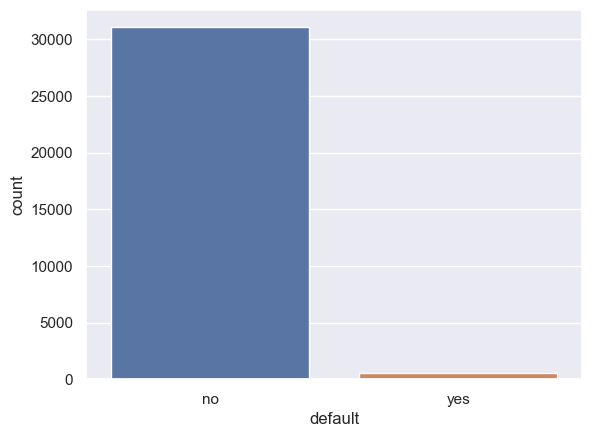

<Figure size 800x600 with 0 Axes>

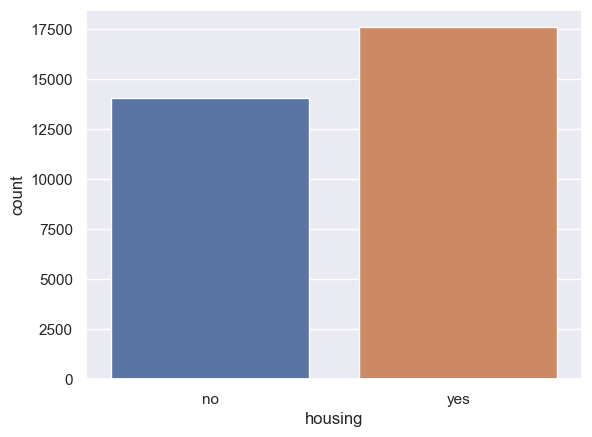

<Figure size 800x600 with 0 Axes>

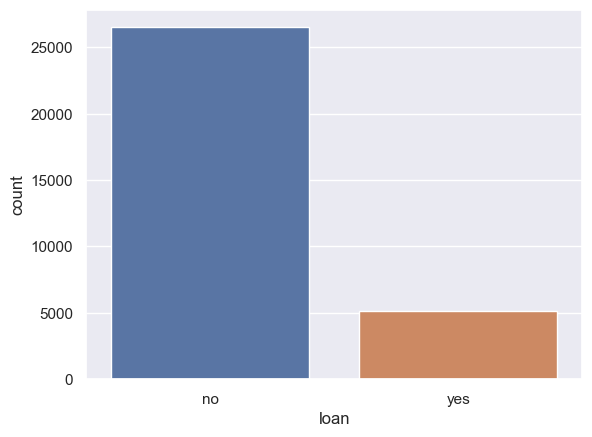

<Figure size 800x600 with 0 Axes>

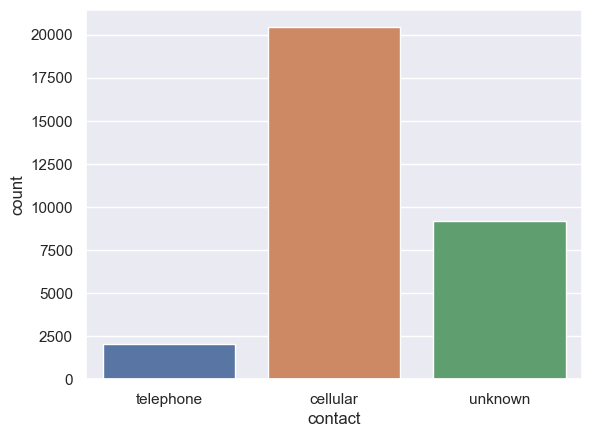

<Figure size 800x600 with 0 Axes>

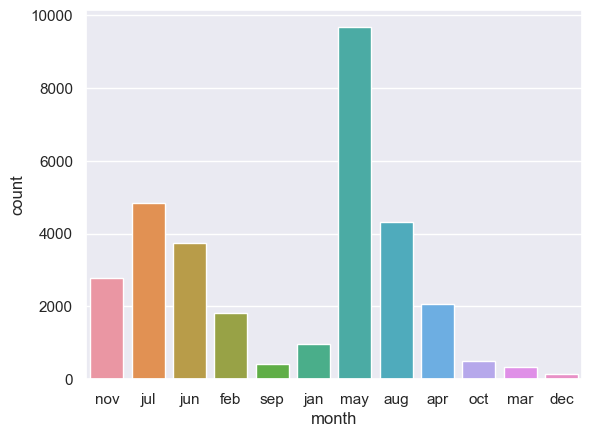

<Figure size 800x600 with 0 Axes>

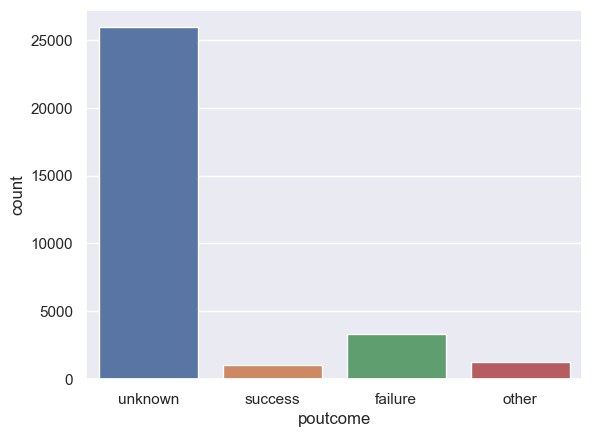

<Figure size 800x600 with 0 Axes>

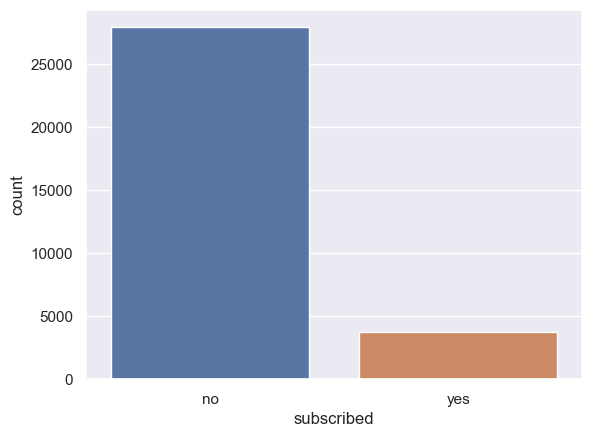

<Figure size 800x600 with 0 Axes>

In [187]:
for i in categorical_col:
    sns.countplot(x=df[i])
    plt.figure(figsize=(8,6))
    plt.show()

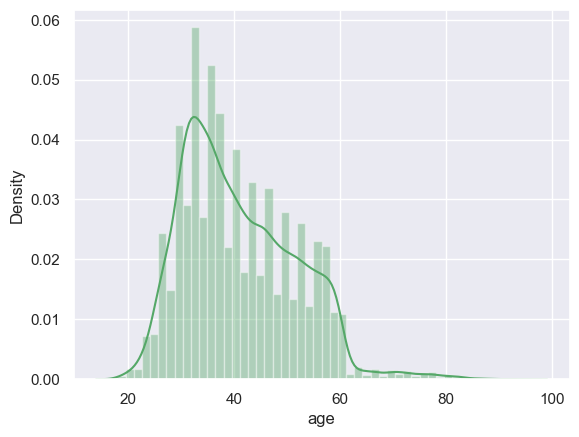

<Figure size 800x600 with 0 Axes>

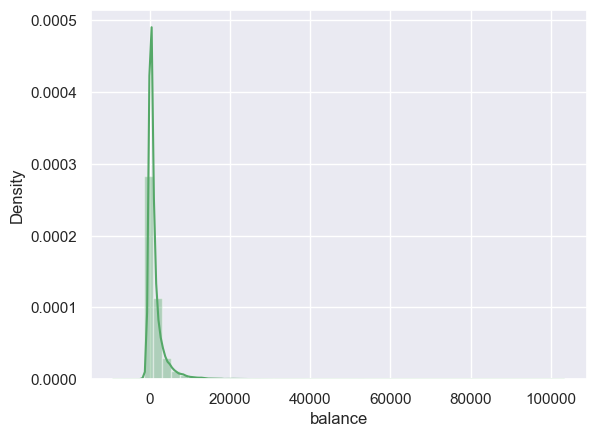

<Figure size 800x600 with 0 Axes>

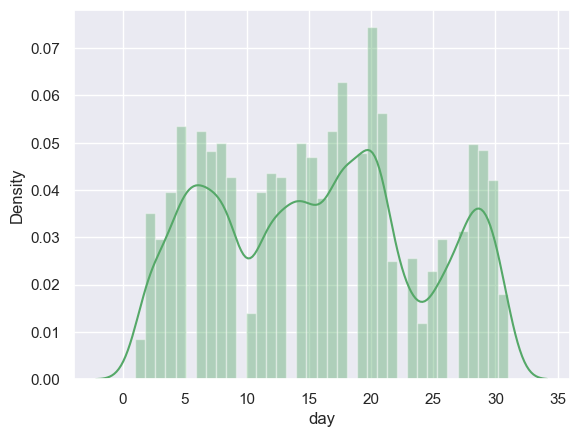

<Figure size 800x600 with 0 Axes>

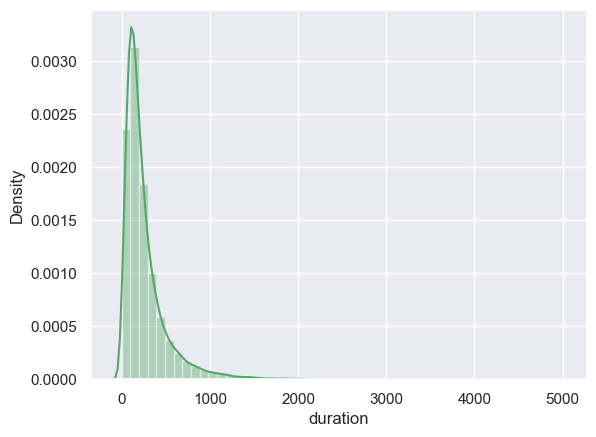

<Figure size 800x600 with 0 Axes>

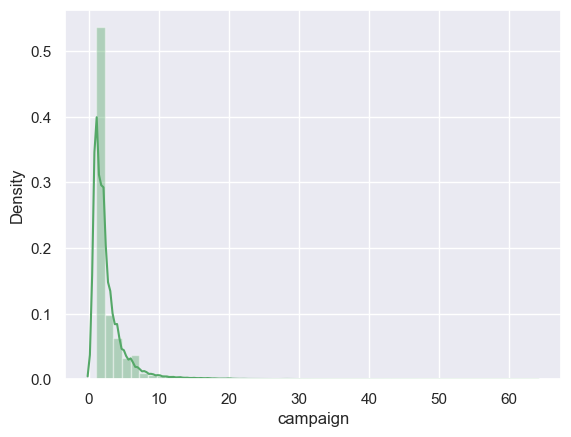

<Figure size 800x600 with 0 Axes>

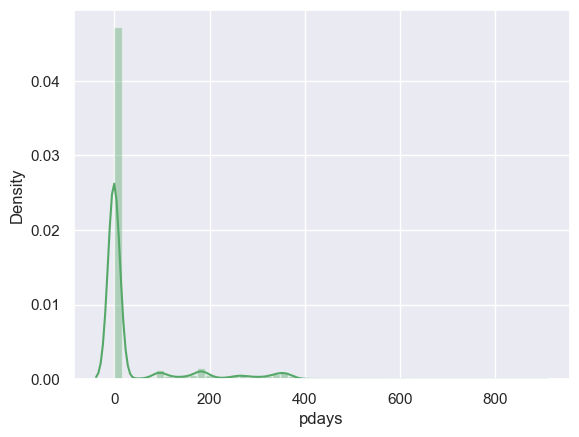

<Figure size 800x600 with 0 Axes>

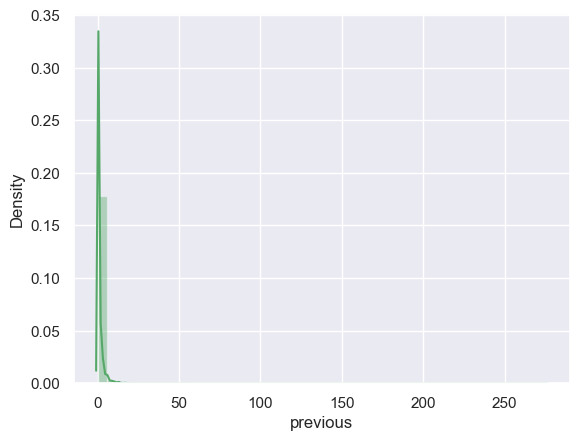

<Figure size 800x600 with 0 Axes>

In [188]:
for i in numerical_col:
    sns.distplot(df[i], color='g')
    plt.figure(figsize=(8,6))
    plt.show()

Bivariate Analysis

In [189]:
from sklearn.preprocessing import LabelEncoder

In [190]:
le=LabelEncoder()
for i in df:
    df[i]=le.fit_transform(df[i])
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,38,0,1,3,0,2719,0,0,1,18,9,43,1,0,0,3,0
1,13,11,1,1,0,822,0,0,0,19,5,90,1,0,0,3,0
2,9,7,1,1,0,1709,1,0,0,17,5,239,0,0,0,3,0
3,39,4,0,2,0,3815,0,0,0,21,6,864,0,79,3,2,1
4,13,9,1,1,0,938,1,0,0,3,3,379,0,0,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,11,4,2,2,0,819,1,0,0,11,8,115,1,0,0,3,0
31643,35,4,0,2,0,1199,0,1,0,4,6,437,1,0,0,3,1
31644,14,4,2,2,0,1131,0,0,0,6,1,36,2,0,0,3,0
31645,39,9,1,1,0,1044,1,0,1,14,8,21,6,332,12,0,0


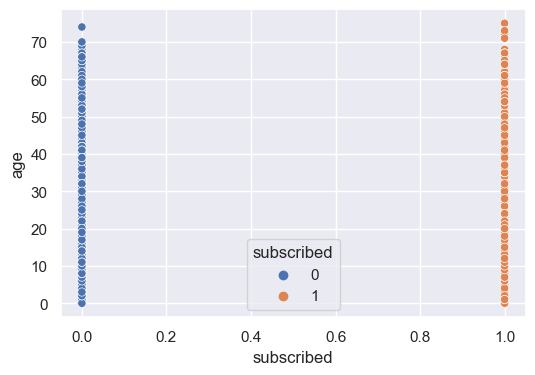

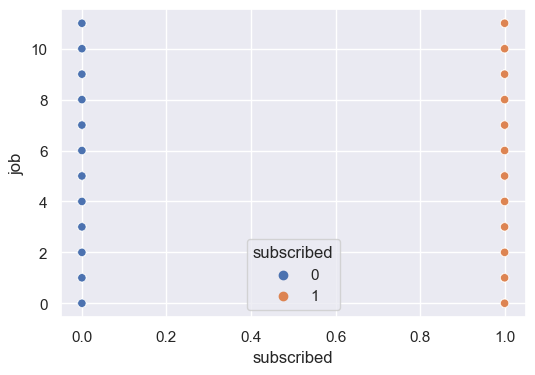

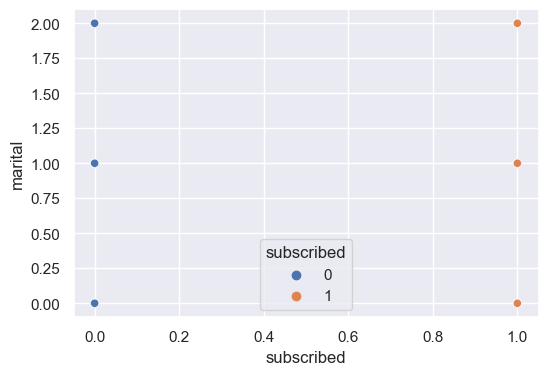

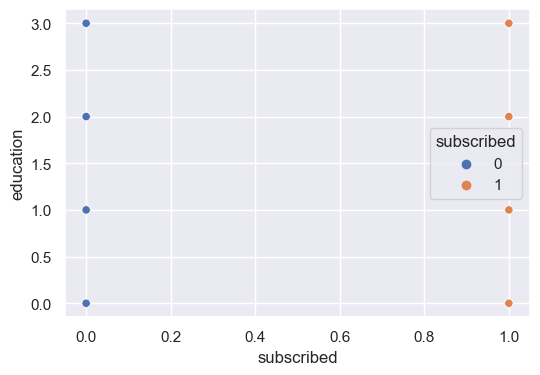

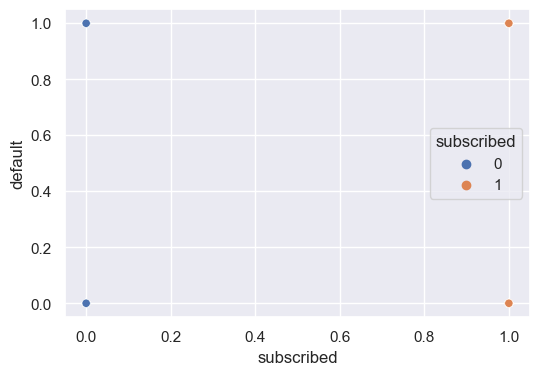

...

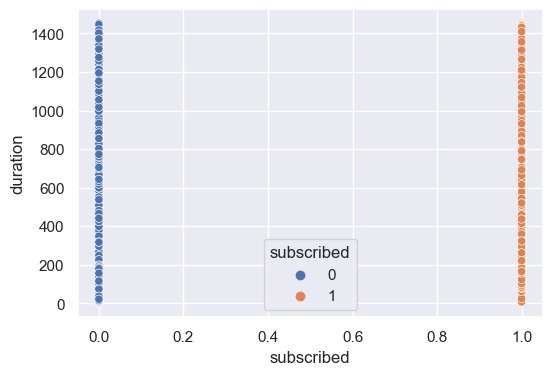

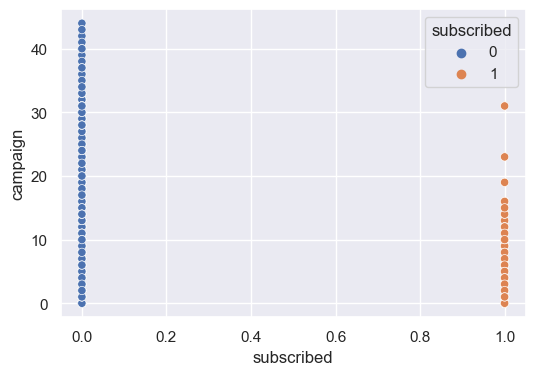

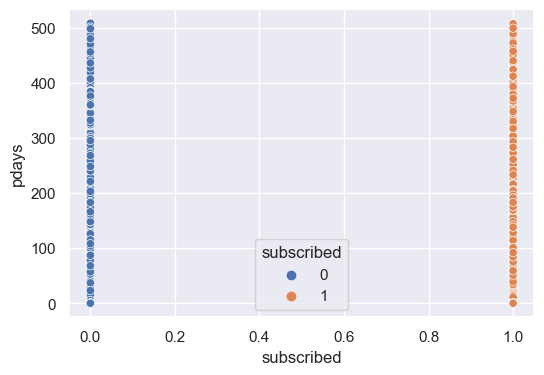

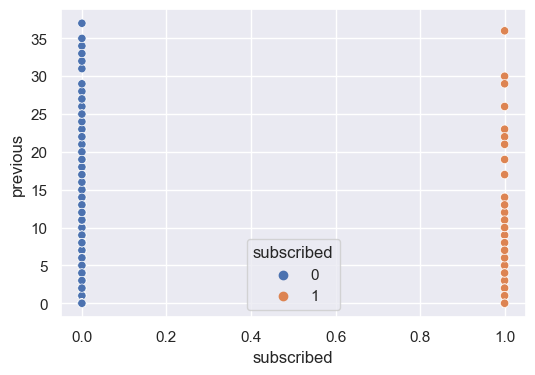

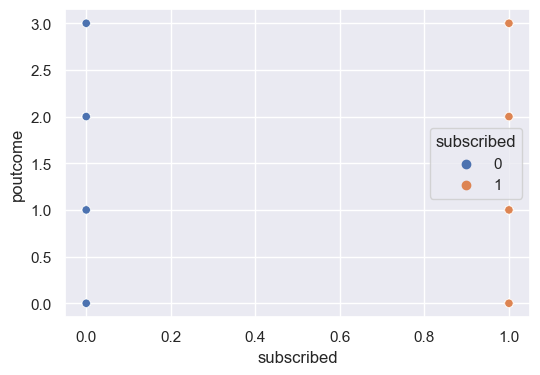

In [191]:
for i in df.drop(['subscribed'],axis=1):
    plt.figure(figsize=(6,4))
    sns.scatterplot(x=df['subscribed'],y=df[i], hue=df['subscribed'])
    plt.show()

Multivariate Analysis

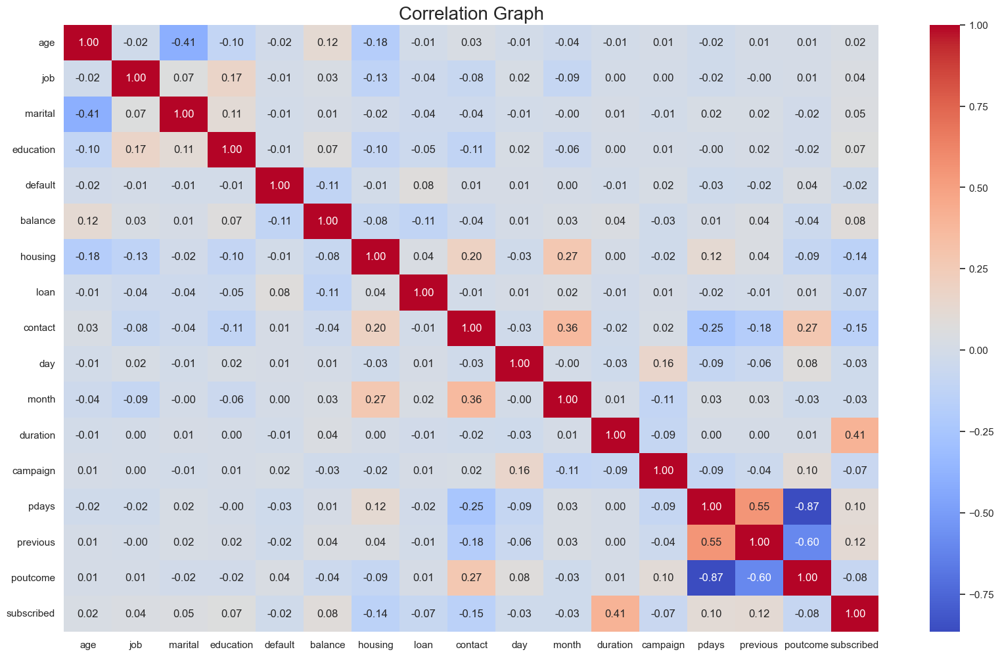

In [192]:
plt.figure(figsize=(20,12))
sns.heatmap(df.corr(), annot=True, fmt='0.2f',linecolor='black', cmap='coolwarm')
plt.title("Correlation Graph", fontsize=20)
plt.show()

Text(0.5, 1.0, 'Correlation of subscribed with Features')

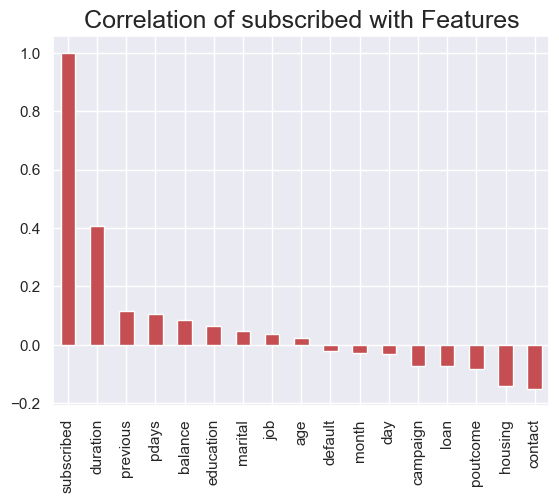

In [193]:
df.corr()['subscribed'].sort_values(ascending=False).plot(kind='bar',color='r')
plt.title('Correlation of subscribed with Features',fontsize=18)

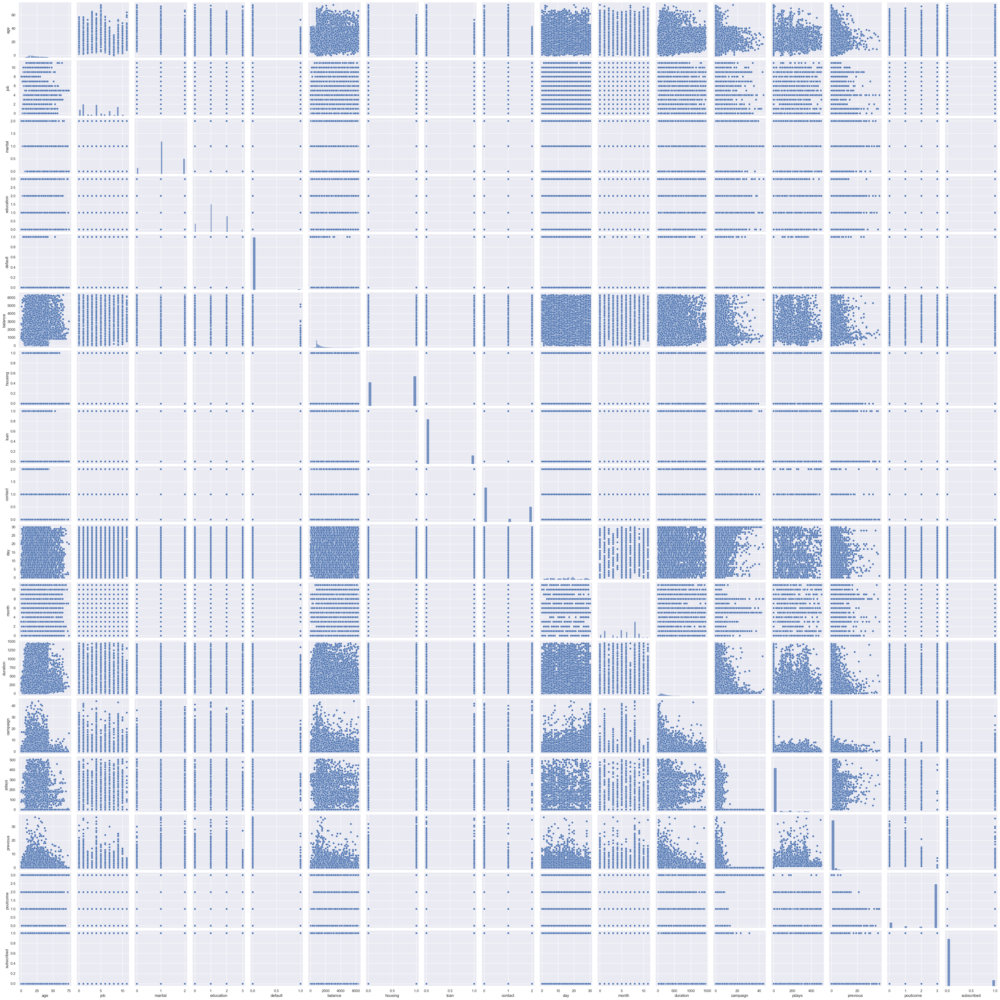

In [194]:
sns.pairplot(df)

In [195]:
df.describe()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
count,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000
mean,22.956520,4.332923,1.167220,1.225013,0.018485,1822.242266,0.555629,0.162132,0.644642,14.835466,5.533131,253.451796,1.764275,39.065946,0.565488,2.566152,0.117389
std,10.621873,3.271868,0.607186,0.749195,0.134700,1352.093883,0.496904,0.368578,0.899480,8.337097,3.004247,235.206200,3.092486,94.878761,1.850987,0.982069,0.321888
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15.000000,1.000000,1.000000,1.000000,0.000000,892.000000,0.000000,0.000000,0.000000,7.000000,3.000000,103.000000,0.000000,0.000000,0.000000,3.000000,0.000000
50%,21.000000,4.000000,1.000000,1.000000,0.000000,1269.000000,1.000000,0.000000,0.000000,15.000000,6.000000,179.000000,1.000000,0.000000,0.000000,3.000000,0.000000
75%,30.000000,7.000000,2.000000,2.000000,0.000000,2245.000000,1.000000,0.000000,2.000000,20.000000,8.000000,317.500000,2.000000,0.000000,0.000000,3.000000,0.000000
max,75.000000,11.000000,2.000000,3.000000,1.000000,6325.000000,1.000000,1.000000,2.000000,30.000000,11.000000,1453.000000,44.000000,508.000000,37.000000,3.000000,1.000000


Checking Outliers in the dataset

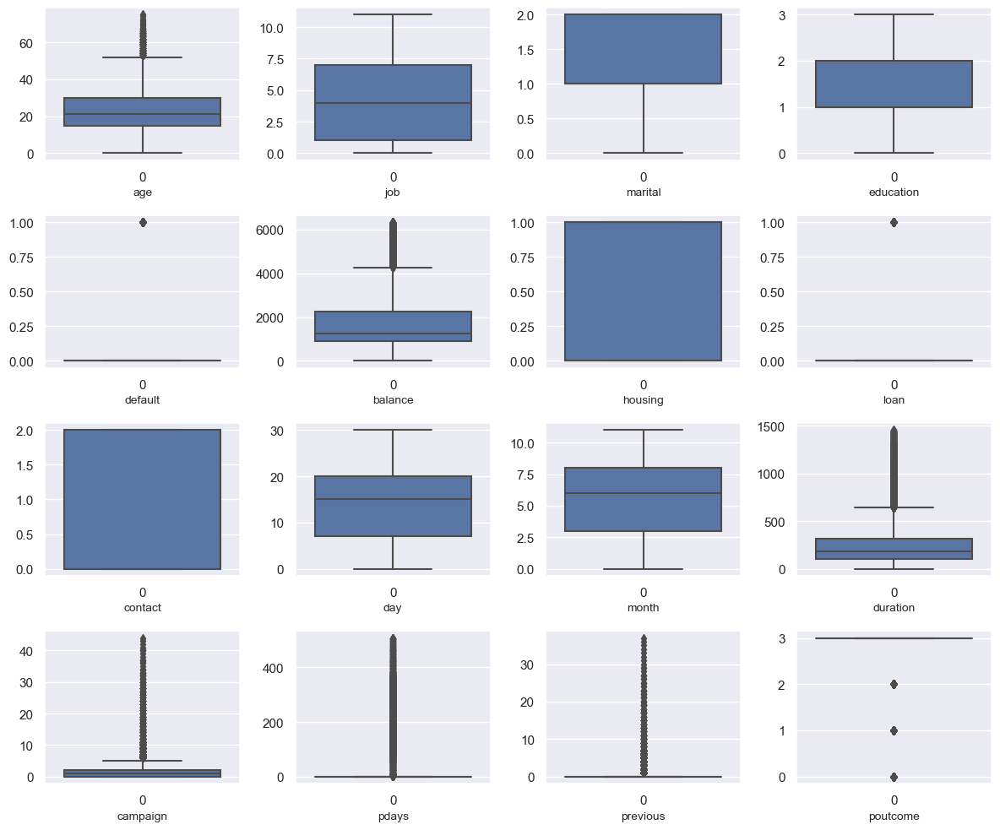

In [196]:
plt.figure(figsize=(12,10), facecolor='white')
plotnumber=1
for i in df.drop(['subscribed'],axis=1):
    if plotnumber<=16:
        plt.subplot(4,4,plotnumber)
        sns.boxplot(df[i], color='b')
        plt.xlabel(i,fontsize=10)
        plotnumber+=1
        
plt.tight_layout()

In [197]:
df.skew()

age           0.678287
job           0.264817
marital      -0.100071
education     0.199441
default       7.149903
balance       1.540853
housing      -0.223918
loan          1.833474
contact       0.758602
day           0.087185
month        -0.486498
duration      2.120862
campaign      4.658975
pdays         2.456607
previous      6.739237
poutcome     -1.996421
subscribed    2.377445
dtype: float64

There are so many outliers in pdays, previous and balance along with high skewness, hence removing these columns.

In [198]:
df.drop(['previous','pdays','balance'],axis=1,inplace=True)

Seperating Features and Label

In [199]:
x=df.drop(['subscribed'],axis=1)
y=df['subscribed']

In [200]:
from scipy.stats import zscore
z=np.abs(zscore(x))
threshold=3

x=x[(z<3).all(axis=1)]
print(x.shape)

y=y[(z<3).all(axis=1)]
print(y.shape)

(29428, 13)
(29428,)


In [201]:
data_loss=round((31647-29558)/31647*100,2)
data_loss

6.6

In [202]:
x.skew()

age          0.449298
job          0.264750
marital     -0.101252
education    0.196828
default      0.000000
housing     -0.248198
loan         1.865499
contact      0.767699
day          0.100236
month       -0.505261
duration     1.504138
campaign     2.067293
poutcome    -1.945938
dtype: float64

In [203]:
from scipy.stats import boxcox,yeojohnson,skew

In [204]:
#This method is for negative and positive both values

def skewness(a):
    model=[np.sqrt(a),np.log(a),yeojohnson(a)[0]]
    print('original skewness is:',a.skew())
    print('\n')
    for m in model:
        x=m
        print(skew(m))
        print('\n')

In [205]:
#This method is for positive values only

def skewness1(i):
    model=[np.sqrt(i),np.log(i),boxcox(i)[0],yeojohnson(i)[0]]
    print("Original Skewness is:", i.skew())
    print('\n')
    for m in model:
        x=m
        print(skew(m))
        print('\n')

In [206]:
skewness(x['duration'])

original skewness is: 1.504137758397215


0.6005787705715926


nan


0.0023467131068794812




In [207]:
x['duration']=yeojohnson(x['duration'])[0]

In [208]:
skewness(x['campaign'])

original skewness is: 2.0672925110814595


0.4917682307550108


nan


0.1500425951749947




In [209]:
x['campaign']=yeojohnson(x['campaign'])[0]

In [210]:
x.skew()

age          0.449298
job          0.264750
marital     -0.101252
education    0.196828
default      0.000000
housing     -0.248198
loan         1.865499
contact      0.767699
day          0.100236
month       -0.505261
duration     0.002347
campaign     0.150050
poutcome    -1.945938
dtype: float64

In [211]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [212]:
def vif():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif['features']=x.columns
    print(vif)

In [213]:
vif()

    VIF Factor   features
0     5.455067        age
1     2.795070        job
2     4.703716    marital
3     3.738312  education
4          NaN    default
5     2.476102    housing
6     1.190688       loan
7     1.971902    contact
8     4.052995        day
9     5.127169      month
10   10.683696   duration
11    2.281009   campaign
12    7.508819   poutcome


In [214]:
#Dropping duration column due to high vif

x.drop(['duration'],axis=1,inplace=True)

In [215]:
vif()

    VIF Factor   features
0     4.748085        age
1     2.765729        job
2     4.266644    marital
3     3.658689  education
4          NaN    default
5     2.397644    housing
6     1.188938       loan
7     1.950150    contact
8     4.016160        day
9     4.977411      month
10    2.280856   campaign
11    6.975464   poutcome


Scaling input data

In [216]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[ 1.51982216, -1.31718769, -0.28278261, ...,  1.14547748,
         0.22143124,  0.44931293],
       [-0.95521605,  2.0300211 , -0.28278261, ..., -0.18482151,
         0.22143124,  0.44931293],
       [-1.35122216,  0.81285427, -0.28278261, ..., -0.18482151,
        -1.11553788,  0.44931293],
       ...,
       [ 1.22281757, -0.10002085, -1.93260949, ...,  0.14775324,
         0.22143124,  0.44931293],
       [-0.85621452, -0.10002085,  1.36704426, ..., -1.5151205 ,
         0.80331732,  0.44931293],
       [ 1.61882368,  1.42143769, -0.28278261, ...,  0.81290273,
         1.68063038, -2.56353398]])

In [217]:
y.value_counts()

0    26357
1     3071
Name: subscribed, dtype: int64

In [218]:
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x,y=sm.fit_resample(x,y)

In [219]:
y.value_counts()

0    26357
1    26357
Name: subscribed, dtype: int64

In [220]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()
from sklearn.metrics import classification_report,confusion_matrix,roc_auc_score,roc_curve,accuracy_score

In [221]:
MaxAccu = 0
MaxRS=0
for i in range(0,200):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=i)
    LR=LogisticRegression()
    LR.fit(x_train, y_train)
    pred = LR.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc>MaxAccu:
        MaxAccu = acc
        MaxRS = i
print("Best accuracy is: ",MaxAccu, "at random state", MaxRS)

Best accuracy is:  0.6914321846348404 at random state 105


Creating Train Test Split

In [222]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=MaxRS)

Modelling

In [223]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

In [224]:
RFC = RandomForestClassifier()
RFC.fit(x_train, y_train)
predRFC= RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

0.9423332279481504
[[7517  382]
 [ 530 7386]]
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      7899
           1       0.95      0.93      0.94      7916

    accuracy                           0.94     15815
   macro avg       0.94      0.94      0.94     15815
weighted avg       0.94      0.94      0.94     15815



In [225]:
SVC = SVC()
SVC.fit(x_train, y_train)
predSVC= SVC.predict(x_test)
print(accuracy_score(y_test,predSVC))
print(confusion_matrix(y_test,predSVC))
print(classification_report(y_test,predSVC))

0.7584571609231742
[[6089 1810]
 [2010 5906]]
              precision    recall  f1-score   support

           0       0.75      0.77      0.76      7899
           1       0.77      0.75      0.76      7916

    accuracy                           0.76     15815
   macro avg       0.76      0.76      0.76     15815
weighted avg       0.76      0.76      0.76     15815



In [226]:
GBC = GradientBoostingClassifier()
GBC.fit(x_train, y_train)
predGBC= GBC.predict(x_test)
print(accuracy_score(y_test,predGBC))
print(confusion_matrix(y_test,predGBC))
print(classification_report(y_test,predGBC))

0.8990199177995574
[[7380  519]
 [1078 6838]]
              precision    recall  f1-score   support

           0       0.87      0.93      0.90      7899
           1       0.93      0.86      0.90      7916

    accuracy                           0.90     15815
   macro avg       0.90      0.90      0.90     15815
weighted avg       0.90      0.90      0.90     15815



In [227]:
ABC = AdaBoostClassifier()
ABC.fit(x_train, y_train)
predABC= ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test,predABC))
print(classification_report(y_test,predABC))

0.8325007903888714
[[6839 1060]
 [1589 6327]]
              precision    recall  f1-score   support

           0       0.81      0.87      0.84      7899
           1       0.86      0.80      0.83      7916

    accuracy                           0.83     15815
   macro avg       0.83      0.83      0.83     15815
weighted avg       0.83      0.83      0.83     15815



In [228]:
BGC = BaggingClassifier()
BGC.fit(x_train, y_train)
predBGC= BGC.predict(x_test)
print(accuracy_score(y_test,predBGC))
print(confusion_matrix(y_test,predBGC))
print(classification_report(y_test,predBGC))

0.9253872905469491
[[7477  422]
 [ 758 7158]]
              precision    recall  f1-score   support

           0       0.91      0.95      0.93      7899
           1       0.94      0.90      0.92      7916

    accuracy                           0.93     15815
   macro avg       0.93      0.93      0.93     15815
weighted avg       0.93      0.93      0.93     15815



In [229]:
ETC = ExtraTreesClassifier()
ETC.fit(x_train, y_train)
predETC= ETC.predict(x_test)
print(accuracy_score(y_test,predETC))
print(confusion_matrix(y_test,predETC))
print(classification_report(y_test,predETC))

0.9464432500790388
[[7417  482]
 [ 365 7551]]
              precision    recall  f1-score   support

           0       0.95      0.94      0.95      7899
           1       0.94      0.95      0.95      7916

    accuracy                           0.95     15815
   macro avg       0.95      0.95      0.95     15815
weighted avg       0.95      0.95      0.95     15815



In [230]:
LGR = LogisticRegression()
LGR.fit(x_train, y_train)
predLGR= LGR.predict(x_test)
print(accuracy_score(y_test,predLGR))
print(confusion_matrix(y_test,predLGR))
print(classification_report(y_test,predLGR))

0.6914321846348404
[[5010 2889]
 [1991 5925]]
              precision    recall  f1-score   support

           0       0.72      0.63      0.67      7899
           1       0.67      0.75      0.71      7916

    accuracy                           0.69     15815
   macro avg       0.69      0.69      0.69     15815
weighted avg       0.69      0.69      0.69     15815



Cross Validation Score

In [231]:
score = cross_val_score(RFC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predRFC) - score.mean())

[0.84738689 0.96594897 0.96623352 0.96708717 0.96186682]
0.9417046735619546
Difference between accuracy score and cross validation score is: 0.000628554386195801


In [232]:
score = cross_val_score(SVC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predSVC) - score.mean())

[0.74513895 0.76467799 0.75813336 0.76989472 0.76057674]
0.7596843512613234
Difference between accuracy score and cross validation score is: -0.00122719033814922


In [233]:
score = cross_val_score(GBC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predGBC) - score.mean())

[0.78051788 0.91235891 0.9146353  0.9161529  0.91168659]
0.8870703155949347
Difference between accuracy score and cross validation score is: 0.011949602204622711


In [234]:
score = cross_val_score(ABC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predABC) - score.mean())

[0.75433937 0.84311866 0.83477189 0.84634355 0.8357048 ]
0.8228556521824878
Difference between accuracy score and cross validation score is: 0.009645138206383574


In [235]:
score = cross_val_score(BGC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predBGC) - score.mean())

[0.81229252 0.95589491 0.9570331  0.9570331  0.95627016]
0.9277047570929995
Difference between accuracy score and cross validation score is: -0.002317466546050362


In [236]:
score = cross_val_score(ETC, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predETC) - score.mean())

[0.91435075 0.9589301  0.96158589 0.95968889 0.95949535]
0.9508101962506293
Difference between accuracy score and cross validation score is: -0.004366946171590502


In [237]:
score = cross_val_score(LGR, x, y)
print(score)
print(score.mean())
print("Difference between accuracy score and cross validation score is:", accuracy_score(y_test,predLGR) - score.mean())

[0.6751399  0.68377122 0.68035663 0.69050555 0.68042117]
0.6820388963515593
Difference between accuracy score and cross validation score is: 0.00939328828328101


In [238]:
from sklearn.metrics import roc_curve, auc
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, predLGR)
roc_auc = auc(false_positive_rate, true_positive_rate)
roc_auc

0.6913707919098119

Hyper Parameter Tuning

In [242]:
from sklearn.model_selection import GridSearchCV
parameters= {'criterion':['gini', 'entropy'], 'max_depth':[10,20], 'n_estimators':[100,200]}

In [243]:
GCV=GridSearchCV(ExtraTreesClassifier(), parameters, cv=5)

In [244]:
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 20], 'n_estimators': [100, 200]})

In [245]:
GCV.best_params_

{'criterion': 'gini', 'max_depth': 20, 'n_estimators': 200}

In [246]:
Final_model = ExtraTreesClassifier(criterion='gini',max_depth=20,n_estimators= 200)

In [247]:
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_test, pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name=Final_model)

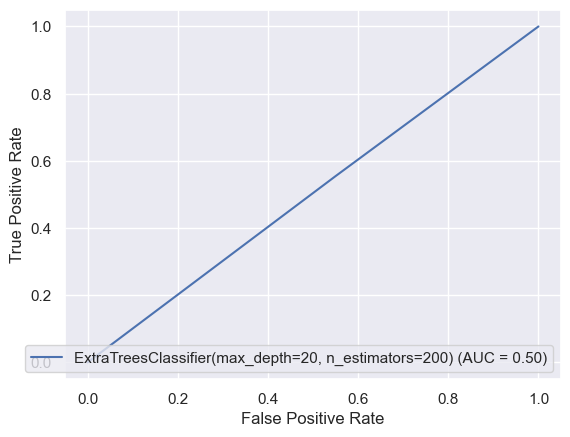

In [248]:
display.plot()

Saving the model

In [250]:
import joblib
joblib.dump(Final_model, "Subscription_Prediction")

['Subscription_Prediction']

In [265]:
df_test=pd.read_csv('https://raw.githubusercontent.com/FlipRoboTechnologies/ML-Datasets/main/Bank%20Marketing/termdeposit_test.csv')
df_test.head(5)

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,38441,32,services,married,secondary,no,118,yes,no,cellular,15,may,20,6,-1,0,unknown
1,40403,78,retired,divorced,primary,no,2787,no,no,telephone,1,jul,372,1,-1,0,unknown
2,3709,31,self-employed,single,tertiary,no,144,yes,no,unknown,16,may,676,1,-1,0,unknown
3,37422,57,services,single,primary,no,3777,yes,no,telephone,13,may,65,2,-1,0,unknown
4,12527,45,blue-collar,divorced,secondary,no,-705,no,yes,unknown,3,jul,111,1,-1,0,unknown


In [266]:
df_test.drop(['ID','previous','pdays','balance','duration'],axis=1,inplace=True)
df_test.head(5)

,age,job,marital,education,default,housing,loan,contact,day,month,campaign,poutcome
0,32,services,married,secondary,no,yes,no,cellular,15,may,6,unknown
1,78,retired,divorced,primary,no,no,no,telephone,1,jul,1,unknown
2,31,self-employed,single,tertiary,no,yes,no,unknown,16,may,1,unknown
3,57,services,single,primary,no,yes,no,telephone,13,may,2,unknown
4,45,blue-collar,divorced,secondary,no,no,yes,unknown,3,jul,1,unknown


In [267]:
le=LabelEncoder()
df_test['job']=le.fit_transform(df_test['job'])
df_test['marital']=le.fit_transform(df_test['marital'])
df_test['education']=le.fit_transform(df_test['education'])
df_test['default']=le.fit_transform(df_test['default'])
df_test['housing']=le.fit_transform(df_test['housing'])
df_test['loan']=le.fit_transform(df_test['loan'])
df_test['contact']=le.fit_transform(df_test['contact'])
df_test['month']=le.fit_transform(df_test['month'])
df_test['poutcome']=le.fit_transform(df_test['poutcome'])

In [268]:
df_test.head()

,age,job,marital,education,default,housing,loan,contact,day,month,campaign,poutcome
0,32,7,1,1,0,1,0,0,15,8,6,3
1,78,5,0,0,0,0,0,1,1,5,1,3
2,31,6,2,2,0,1,0,2,16,8,1,3
3,57,7,2,0,0,1,0,1,13,8,2,3
4,45,1,0,1,0,0,1,2,3,5,1,3


In [269]:
from scipy.stats import zscore
z=np.abs(zscore(df_test))
threshold=3

Xtest=df_test[(z<3).all(axis=1)]
print(Xtest.shape)

(12940, 12)


In [270]:
Xtest.head()

,age,job,marital,education,default,housing,loan,contact,day,month,campaign,poutcome
0,32,7,1,1,0,1,0,0,15,8,6,3
2,31,6,2,2,0,1,0,2,16,8,1,3
3,57,7,2,0,0,1,0,1,13,8,2,3
4,45,1,0,1,0,0,1,2,3,5,1,3
5,32,4,2,2,0,1,0,0,22,5,2,3


In [272]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
Xtest=sc.fit_transform(Xtest)
Xtest

array([[-0.8527007 ,  0.80620379, -0.28174092, ...,  0.8214164 ,
         1.89032711,  0.45857576],
       [-0.95162171,  0.50198481,  1.35826247, ...,  0.8214164 ,
        -0.7595302 ,  0.45857576],
       [ 1.62032473,  0.80620379,  1.35826247, ...,  0.8214164 ,
        -0.22955874,  0.45857576],
       ...,
       [-0.55593764,  0.19776584, -0.28174092, ..., -0.50415923,
        -0.7595302 ,  0.45857576],
       [-1.14946375, -1.32332902,  1.35826247, ...,  1.1528103 ,
        -0.22955874, -0.52647907],
       [-1.14946375, -1.32332902, -0.28174092, ...,  0.8214164 ,
        -0.7595302 , -2.49658873]])

In [274]:
import joblib
bank=joblib.load("Subscription_Prediction")

In [275]:
bank

ExtraTreesClassifier(max_depth=20, n_estimators=200)